In [34]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import pandas as pd
import seaborn as sns
from pandas import ExcelWriter
from pandas import ExcelFile
import sample_utils

%matplotlib inline

# TRUE DATA

In [35]:
file_path = '2020_LER_20201102_testset_V04.xlsx'

data = np.load('../data_handler/'+file_path+'.npy', allow_pickle=True)
num_in_cycle = [250]*10
num_of_cycle = 10
    
X_all, Y_all, X_per_cycle, Y_per_cycle = data[0], data[1], data[2], data[3]
print(data[0].shape, data[1].shape, data[2].shape, data[3].shape)
print()
test_real = Y_all

# for pair plot indexing
test_X_cycle = X_per_cycle

y_mean = np.mean(Y_all, axis=0, dtype=np.float32)
y_std = np.std(Y_all, axis=0, dtype=np.float32)

print("!! check !! test real shape", test_real.shape)
print("!! check !! X value ( especially its precision )")
print()
for i in range(num_of_cycle):
    print(test_X_cycle[i])

(2500, 5) (2500, 6) (10, 5) (10, 6)

!! check !! test real shape (2500, 6)
!! check !! X value ( especially its precision )

[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979  1.          0.        ]
[ 0.50466944 48.62398816 67.99380535  1.          0.        ]
[ 0.56045148 25.42868151 69.39740975  1.          0.        ]
[ 0.63730798 69.14860261 65.33037708  1.          0.        ]
[  0.72951307  89.39156879 205.62484728   1.           0.        ]
[ 0.15273618 23.32639122 51.25326965  1.          0.        ]
[ 0.68988283 85.08858437 80.98368203  1.          0.        ]
[ 0.25925637 78.12653757 28.08679576  1.          0.        ]
[1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


# TRUE data_A , data_B

In [36]:
file_path = '2020_LER_20201102_testset_V04.xlsx'

# data_A

data = np.load('../data_handler/'+file_path+'_data_a'+'.npy', allow_pickle=True)
num_in_cycle_half = [125]*10
num_of_cycle = 10
    
A_X_all, A_Y_all, A_X_per_cycle, A_Y_per_cycle = np.array(data[0]), np.array(data[1]), np.array(data[2]), np.array(data[3])

print(A_X_all.shape, A_Y_all.shape, A_X_per_cycle.shape, A_Y_per_cycle.shape)
print()
A_test_real = A_Y_all

# for pair plot indexing
A_test_X_cycle = A_X_per_cycle

A_y_mean = np.mean(A_Y_all, axis=0, dtype=np.float32)
A_y_std = np.std(A_Y_all, axis=0, dtype=np.float32)

print("!! check !! test real shape", A_test_real.shape)
print("!! check !! X value ( especially its precision )")
print()
for i in range(num_of_cycle):
    print(A_test_X_cycle[i])

# data_B
    
data = np.load('../data_handler/'+file_path+'_data_b'+'.npy', allow_pickle=True)
    
B_X_all, B_Y_all, B_X_per_cycle, B_Y_per_cycle = np.array(data[0]), np.array(data[1]), np.array(data[2]), np.array(data[3])
print(B_X_all.shape, B_Y_all.shape, B_X_per_cycle.shape, B_Y_per_cycle.shape)
print()
B_test_real = B_Y_all

# for pair plot indexing
B_test_X_cycle = B_X_per_cycle

B_y_mean = np.mean(B_Y_all, axis=0, dtype=np.float32)
B_y_std = np.std(B_Y_all, axis=0, dtype=np.float32)

print("!! check !! test real shape", B_test_real.shape)
print("!! check !! X value ( especially its precision )")
print()
for i in range(num_of_cycle):
    print(B_test_X_cycle[i])

(1250, 5) (1250, 6) (10, 5) (10, 6)

!! check !! test real shape (1250, 6)
!! check !! X value ( especially its precision )

[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979  1.          0.        ]
[ 0.50466944 48.62398816 67.99380535  1.          0.        ]
[ 0.56045148 25.42868151 69.39740975  1.          0.        ]
[ 0.63730798 69.14860261 65.33037708  1.          0.        ]
[  0.72951307  89.39156879 205.62484728   1.           0.        ]
[ 0.15273618 23.32639122 51.25326965  1.          0.        ]
[ 0.68988283 85.08858437 80.98368203  1.          0.        ]
[ 0.25925637 78.12653757 28.08679576  1.          0.        ]
[1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]
(1250, 5) (1250, 6) (10, 5) (10, 6)

!! check !! test real shape (1250, 6)
!! check !! X value ( especially its precision )

[  0.62484672  17.00743225 173.85718891   1.           0.        ]
[ 0.55654727 80.91905766 80.56986979 

# STEP 1. 두개의 TRUE DATA 비교(125개씩)

# SCALE

In [37]:
min1_per_out_v = A_test_real.min(axis=0)
max1_per_out_v = A_test_real.max(axis=0)
print("minimum y value for each varaible:", min1_per_out_v)
print("maximum y value for each varaible:", max1_per_out_v)

min2_per_out_v = B_test_real.min(axis=0)
max2_per_out_v = B_test_real.max(axis=0)
print("minimum y value for each varaible:", min2_per_out_v)
print("maximum y value for each varaible:", max2_per_out_v)

min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

minimum y value for each varaible: [5.9880e-13 3.1240e-05 1.2840e-05 3.1800e-01 3.3000e-01 6.0804e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.7200e-01 3.7800e-01 6.3893e+01]
minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.2300e-01 3.3500e-01 6.0765e+01]
maximum y value for each varaible: [6.100e-12 4.563e-05 1.854e-05 3.940e-01 3.970e-01 6.332e+01]


# EMD integral

In [38]:
# EMD  

EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = A_test_real, real_samples = B_test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=num_in_cycle_half, num_in_real_list = num_in_cycle_half, min_list = min_per_out_v, max_list = max_per_out_v) 

print(EMD_1d_score_list.shape)
print(EMD_2d_score_list.shape)

EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

EMD_score = np.mean(EMD_score_cat)
EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

for i in range(len(EMD_score_list_integral)):
    print("EMD_score for each X factor {} \t score {:5f} \t dev {:5f}".format(i, EMD_score_list_integral[i], (EMD_score_list_integral[i]-EMD_score)/EMD_std))
# A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classs

EMD_score_list = np.array(EMD_score_list_integral)
print("EMD score: ", EMD_score)

 
print("EMD argsort: ", EMD_score_list.argsort())

(10, 6)
(10, 15)
EMD_score for each X factor 0 	 score 0.145094 	 dev 0.008679
EMD_score for each X factor 1 	 score 0.248157 	 dev 1.234819
EMD_score for each X factor 2 	 score 0.137926 	 dev -0.076601
EMD_score for each X factor 3 	 score 0.114432 	 dev -0.356106
EMD_score for each X factor 4 	 score 0.168718 	 dev 0.289736
EMD_score for each X factor 5 	 score 0.227571 	 dev 0.989900
EMD_score for each X factor 6 	 score 0.040902 	 dev -1.230885
EMD_score for each X factor 7 	 score 0.280642 	 dev 1.621289
EMD_score for each X factor 8 	 score 0.025823 	 dev -1.410276
EMD_score for each X factor 9 	 score 0.054379 	 dev -1.070554
EMD score:  0.14436437328570426
EMD argsort:  [8 6 9 3 2 0 4 5 1 7]


# SAME SCALE

factor 0
0 125
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


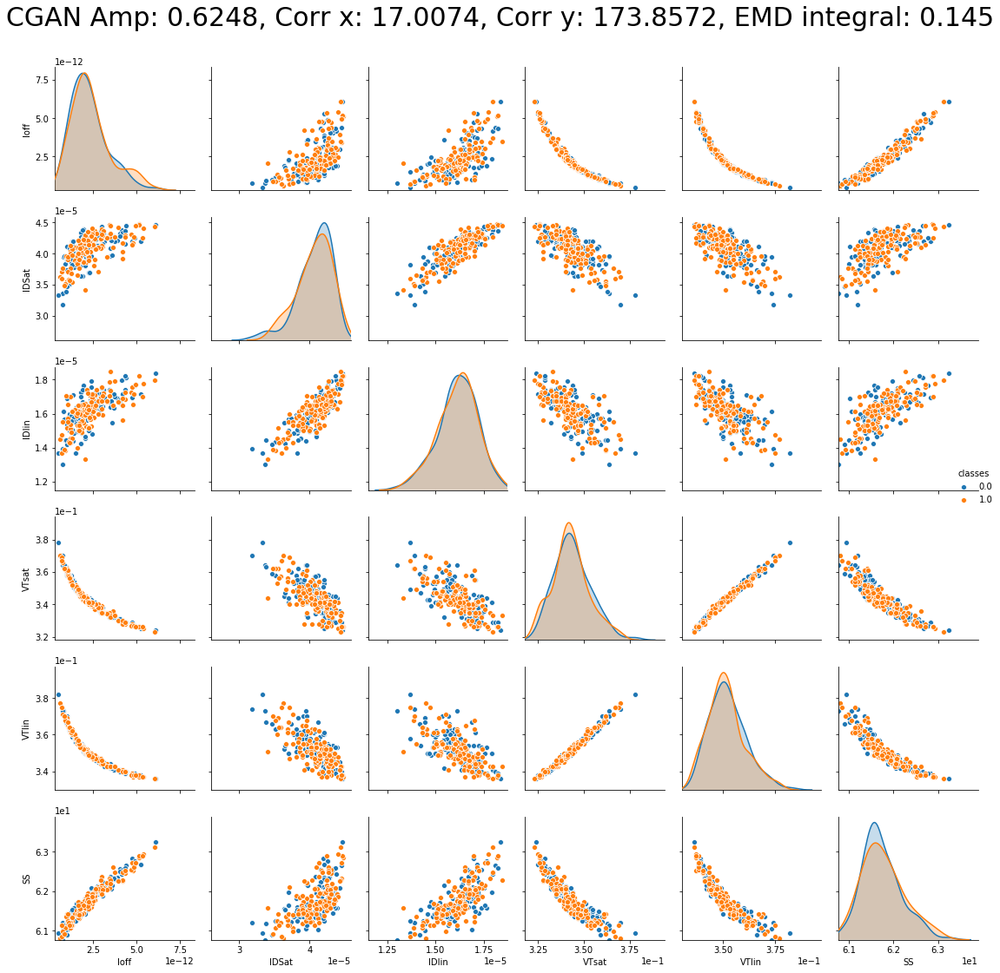

factor 1
125 250
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


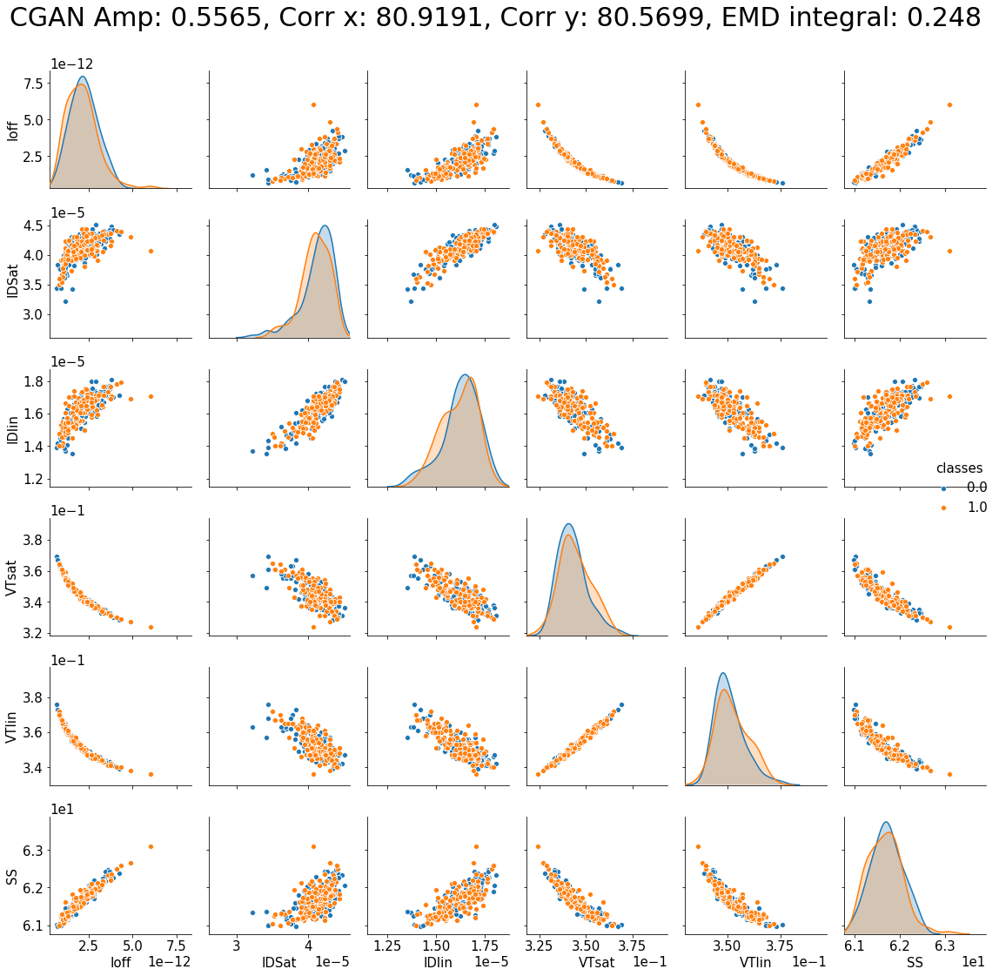

factor 2
250 375
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


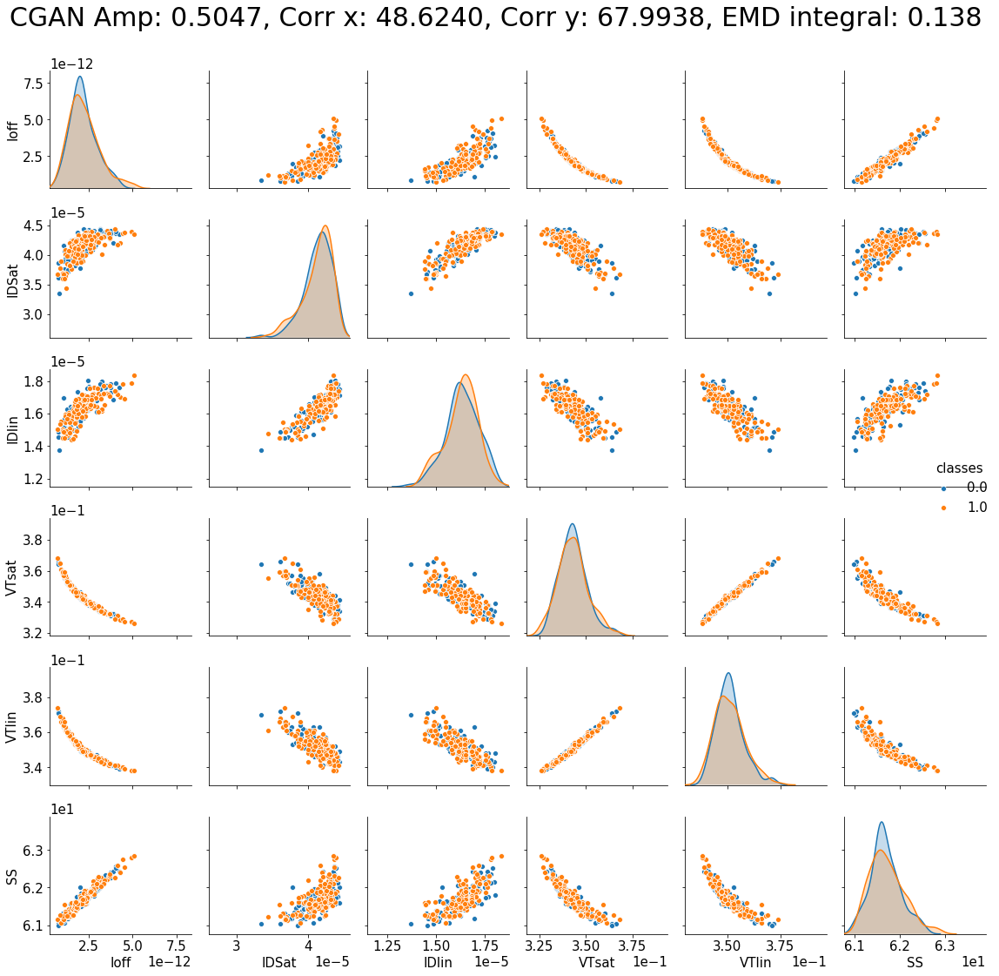

factor 3
375 500
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


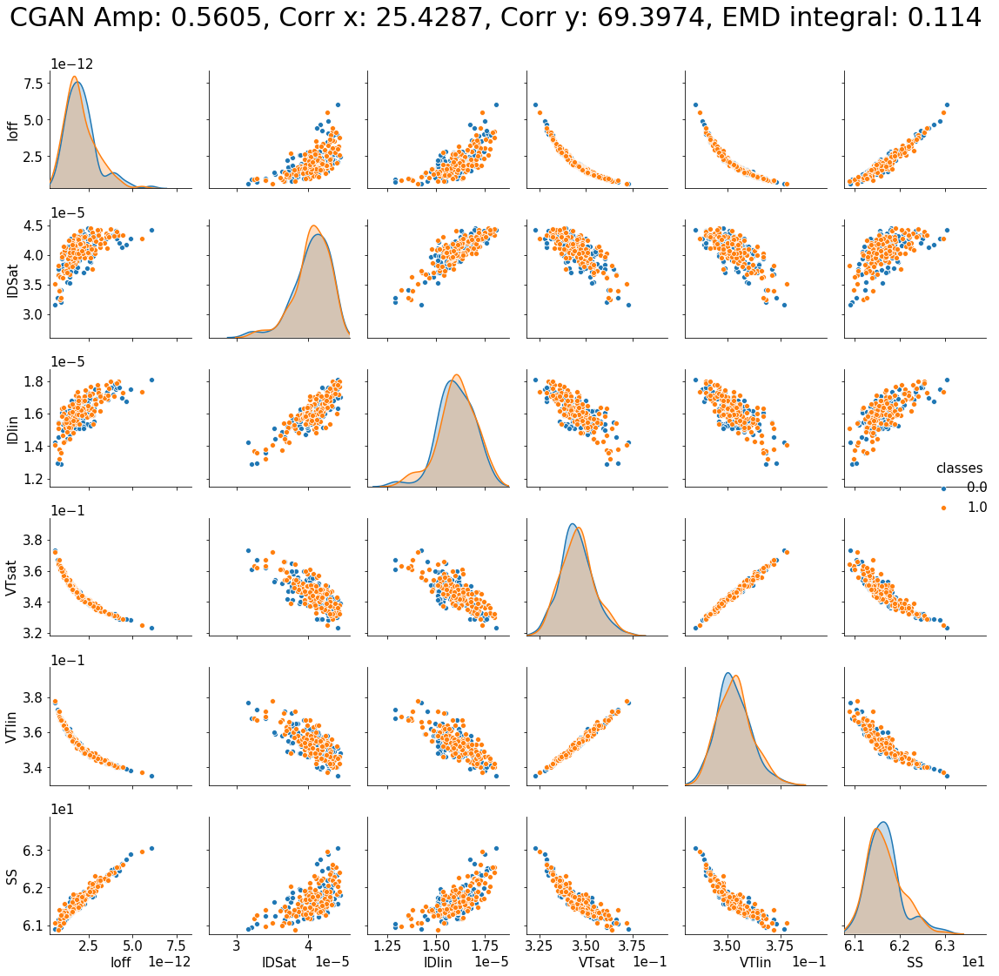

factor 4
500 625
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


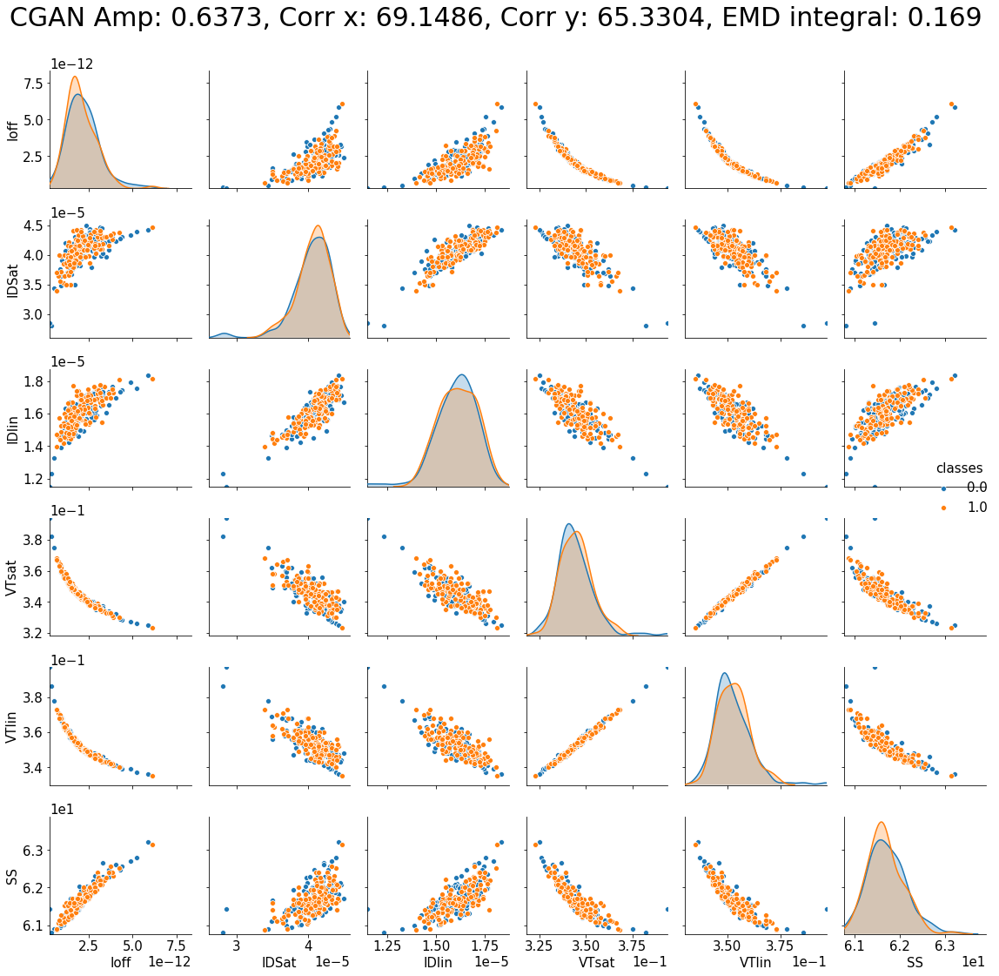

factor 5
625 750
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


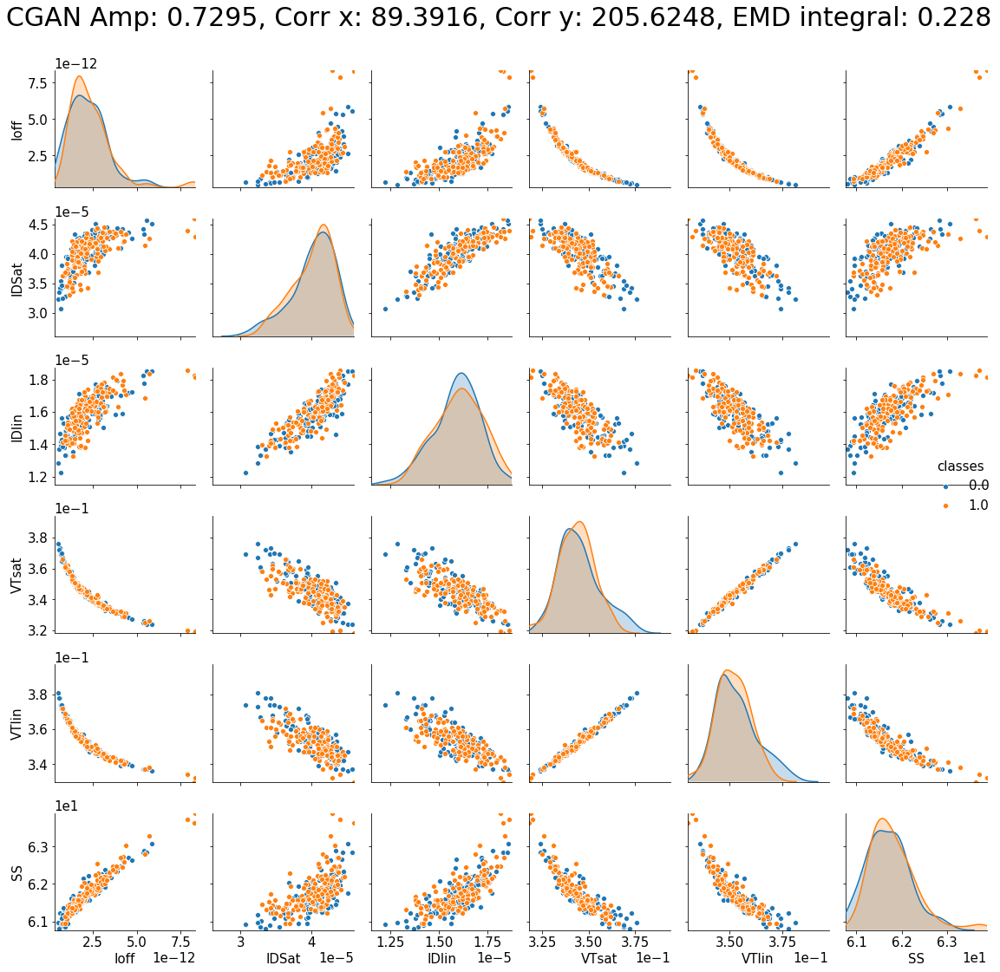

factor 6
750 875
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


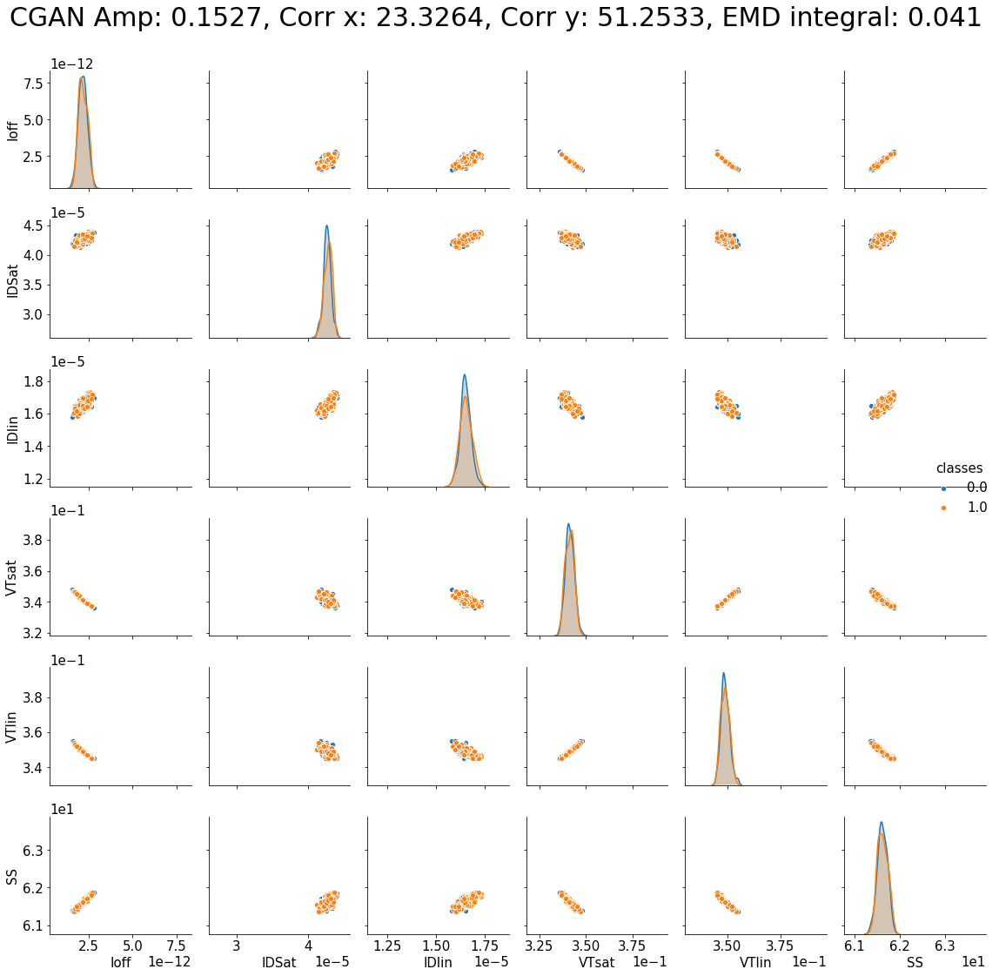

factor 7
875 1000
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


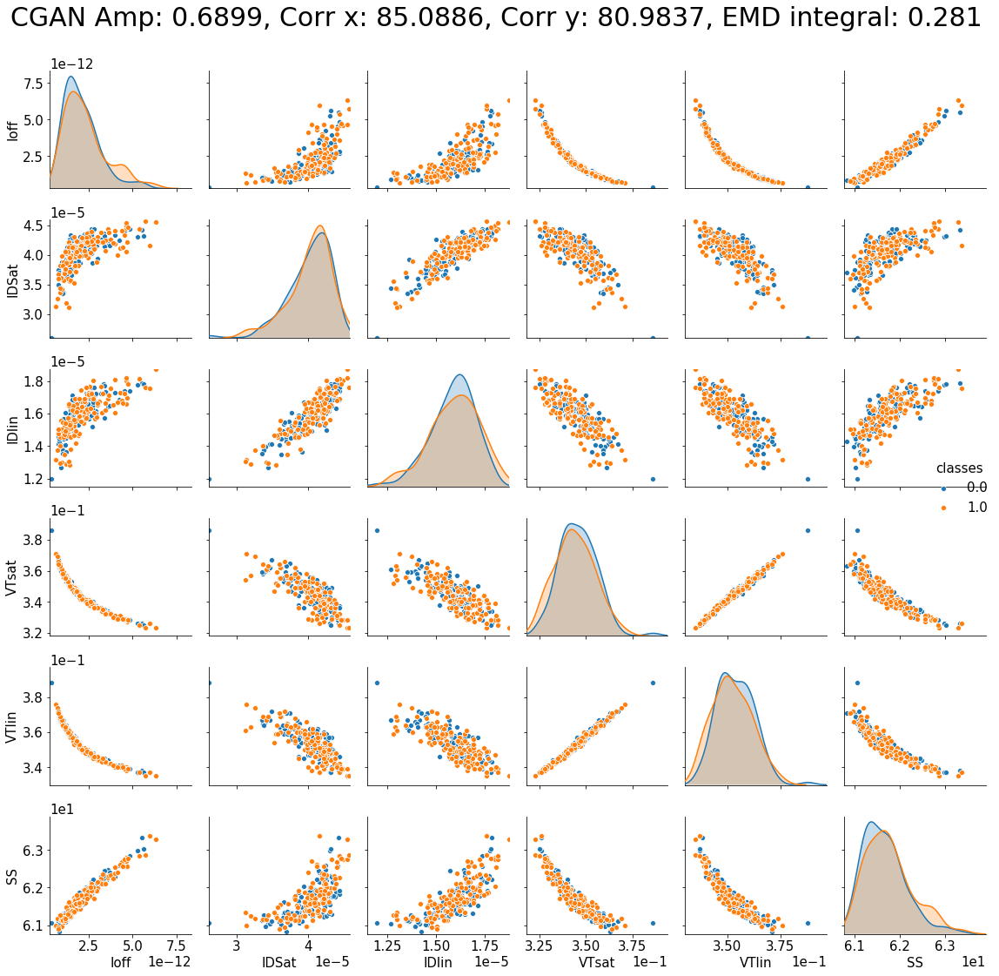

factor 8
1000 1125
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


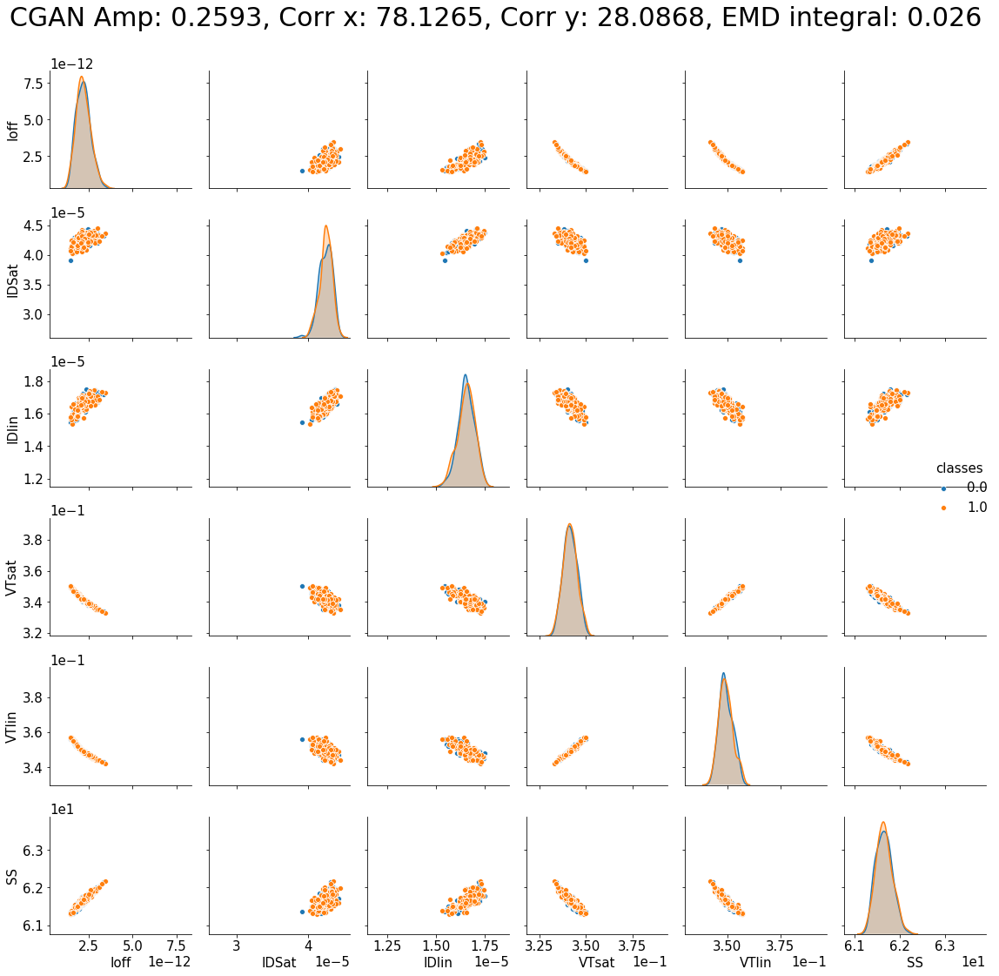

factor 9
1125 1250
real A sample shape: (125, 6)
real B sample shape: (125, 6)

Assigning class for visualization (B: 0, A:1 )
real A sample class shape: (125, 1)
real B sample class shape: (125, 1)
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


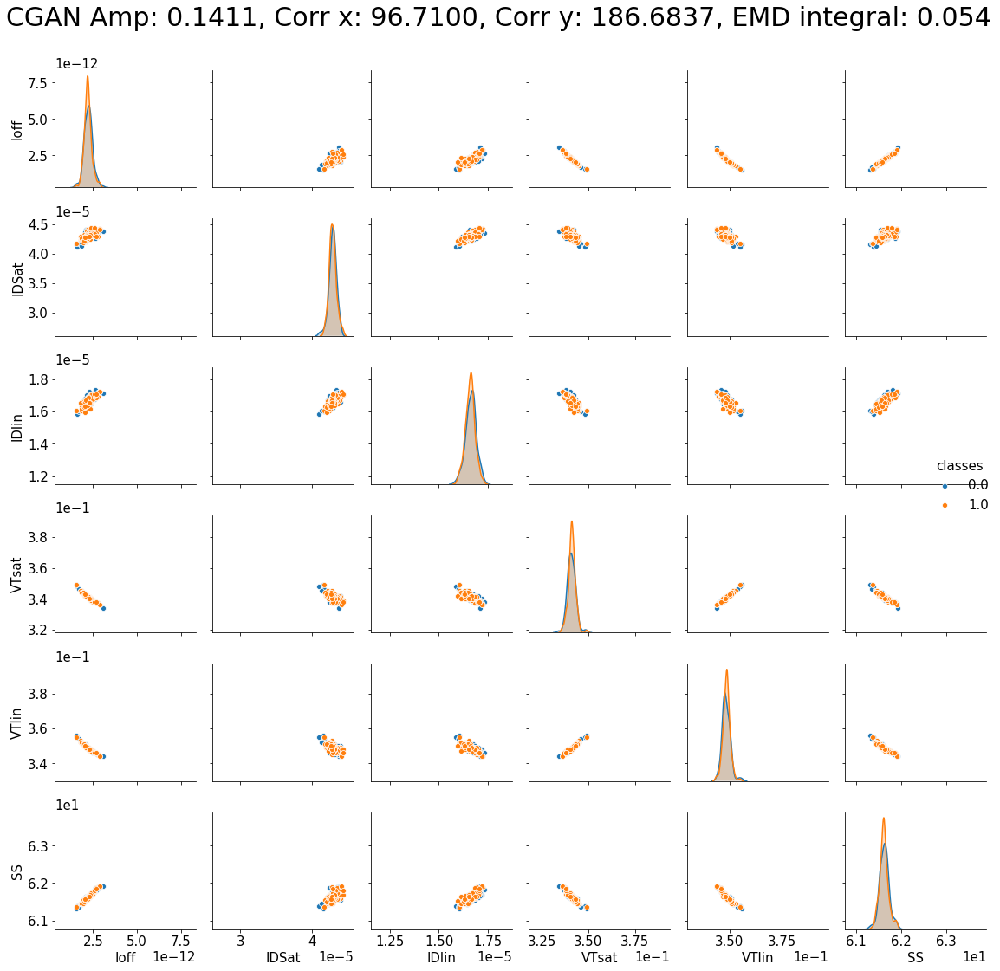

In [39]:
for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle_half[:factor]),sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor])
    test_real_A_matrix_plot = A_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real A sample shape:", test_real_A_matrix_plot.shape)

    # real sample
    test_real_B_matrix_plot = B_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real B sample shape:", test_real_B_matrix_plot.shape)
    print()

    # Assigning class(B: 0, A:1 ) for visualization

    print("Assigning class for visualization (B: 0, A:1 )")

    test_real_A_cls = np.ones((num_in_cycle_half[factor], 1))
    print("real A sample class shape:", test_real_A_cls.shape)
    test_real_B_cls = np.zeros((num_in_cycle_half[factor], 1))
    print("real B sample class shape:", test_real_B_cls.shape)

    test_temp1 = np.hstack([test_real_A_matrix_plot, test_real_A_cls])
    test_temp2 = np.hstack([test_real_B_matrix_plot, test_real_B_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)
    
#     print(np.min(test_min_list))
#     print(np.max(test_max_list, axis=1))
    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}, EMD integral: {:.3f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((min_per_out_v[i], max_per_out_v[i]))
        g.axes[i,i].set_ylim((min_per_out_v[i], max_per_out_v[i]))
    
    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')
    
    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/real_Test_same_factor_{}_sample_{}.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()
    
    ### 파란색이 real 주황색이 generated

# STEP 2. TRUE와 GENERARED DATA 비교 (125개씩)

# GENERATED DATA
### Please put your sampled data file(in .npy) in the same directory

In [56]:
########################################  CHANGE HERE ####################################################################

result = 'test_specificdate_210113_GIT_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_125_tr_num_in_cycle_50_pdrop_0.5.npy'
# mean 상수 변경 전: test_specificdate_201101_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_100_50_batch_size_32_noise_d_100_sample_num_125_tr_num_in_cycle_50_pdrop_0.5.npy
# mean 상수 변경: test_specificdate_210109_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_200_50_batch_size_32_noise_d_100_sample_num_150_tr_num_in_cycle_50_pdrop_0.5.npy

##########################################################################################################################

test_gen = np.load(result, allow_pickle=True)

num_of_cycle = 10


test_gen_sample_num = int(test_gen.shape[0]/num_of_cycle)

print("test data sample num", test_gen_sample_num)
print("test data shape", test_gen.shape)


test data sample num 125
test data shape (1250, 6)


# SCALE

In [57]:
min1_per_out_v = A_test_real.min(axis=0)
max1_per_out_v = A_test_real.max(axis=0)
print("minimum y value for each varaible:", min1_per_out_v)
print("maximum y value for each varaible:", max1_per_out_v)

min2_per_out_v = test_gen.min(axis=0)
max2_per_out_v = test_gen.max(axis=0)
print("minimum y value for each varaible:", min2_per_out_v)
print("maximum y value for each varaible:", max2_per_out_v)

min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

minimum y value for each varaible: [5.9880e-13 3.1240e-05 1.2840e-05 3.1800e-01 3.3000e-01 6.0804e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.7200e-01 3.7800e-01 6.3893e+01]
minimum y value for each varaible: [4.38762645e-13 2.91093188e-05 1.26686227e-05 3.20547201e-01
 3.34153693e-01 6.09268028e+01]
maximum y value for each varaible: [7.97410720e-12 4.53250686e-05 1.82754216e-05 3.74326415e-01
 3.79309215e-01 6.39026715e+01]


# EMD Integral

In [58]:
# EMD  

EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = test_gen, real_samples = A_test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=[test_gen_sample_num]*num_of_cycle, num_in_real_list = num_in_cycle_half, min_list = min_per_out_v, max_list = max_per_out_v) 

print(EMD_1d_score_list.shape)
print(EMD_2d_score_list.shape)

EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

EMD_score = np.mean(EMD_score_cat)
EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

for i in range(len(EMD_score_list_integral)):
    print("EMD_score for each X factor {} \t score {:5f} \t dev {:5f}".format(i, EMD_score_list_integral[i], (EMD_score_list_integral[i]-EMD_score)/EMD_std))
# A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classs

EMD_score_list = np.array(EMD_score_list_integral)
print("EMD score: ", EMD_score)

 
print("EMD argsort: ", EMD_score_list.argsort())

(10, 6)
(10, 15)
EMD_score for each X factor 0 	 score 0.316199 	 dev 0.772885
EMD_score for each X factor 1 	 score 0.239768 	 dev 0.051820
EMD_score for each X factor 2 	 score 0.257227 	 dev 0.216531
EMD_score for each X factor 3 	 score 0.261482 	 dev 0.256678
EMD_score for each X factor 4 	 score 0.333953 	 dev 0.940378
EMD_score for each X factor 5 	 score 0.401592 	 dev 1.578493
EMD_score for each X factor 6 	 score 0.058756 	 dev -1.655867
EMD_score for each X factor 7 	 score 0.265963 	 dev 0.298949
EMD_score for each X factor 8 	 score 0.121403 	 dev -1.064851
EMD_score for each X factor 9 	 score 0.086406 	 dev -1.395015
EMD score:  0.234274743803932
EMD argsort:  [6 9 8 1 2 3 7 0 4 5]


# GEN / REAL ( 개당 125개, 10set ) Pair plot

# 1. Custom scale

factor 0
0 125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [6.13500000e-13 3.14580859e-05 1.30001732e-05 3.22852034e-01
 3.35388068e-01 6.08040000e+01 0.00000000e+00]
maximum y value for each varaible: [7.03710164e-12 4.47500000e-05 1.84700000e-05 3.71901383e-01
 3.77000000e-01 6.35733124e+01 1.00000000e+00]
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


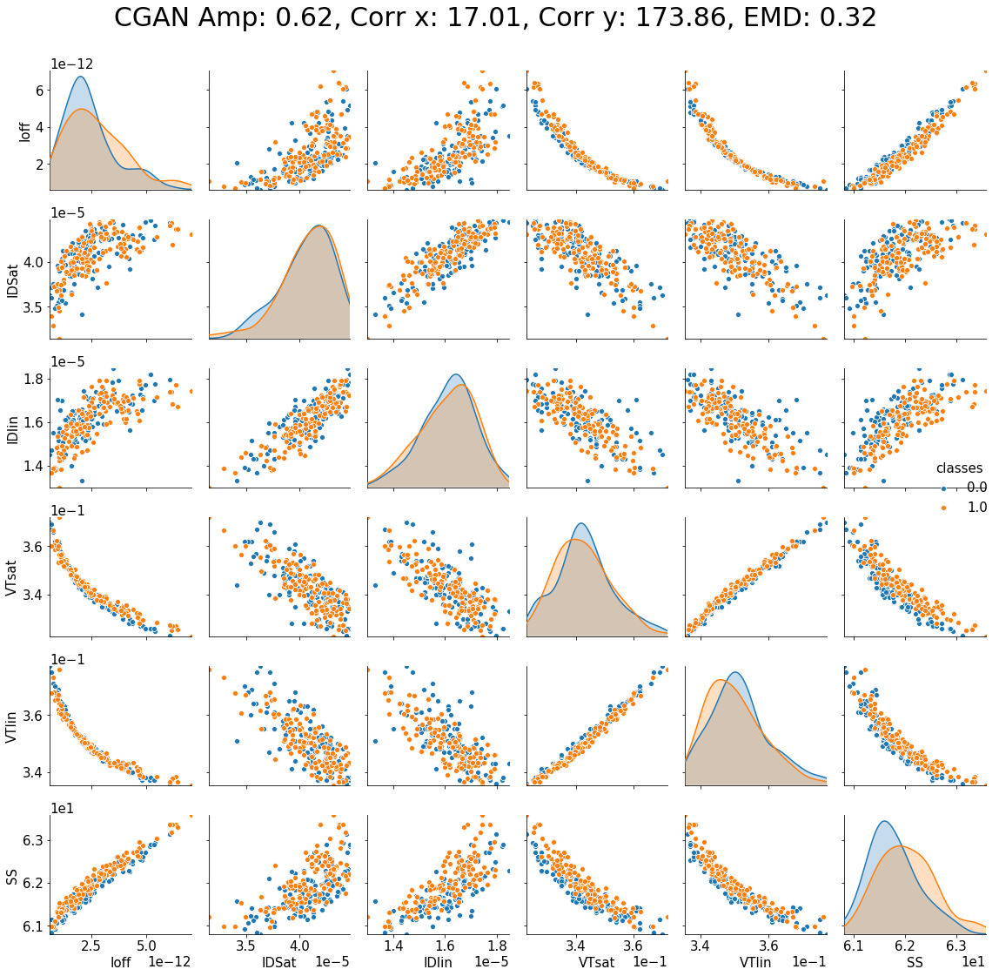

factor 1
125 250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [8.21800000e-13 3.38233523e-05 1.40000000e-05 3.24000000e-01
 3.36000000e-01 6.09940000e+01 0.00000000e+00]
maximum y value for each varaible: [6.02805704e-12 4.43600000e-05 1.79500000e-05 3.65000000e-01
 3.72000000e-01 6.32932457e+01 1.00000000e+00]
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


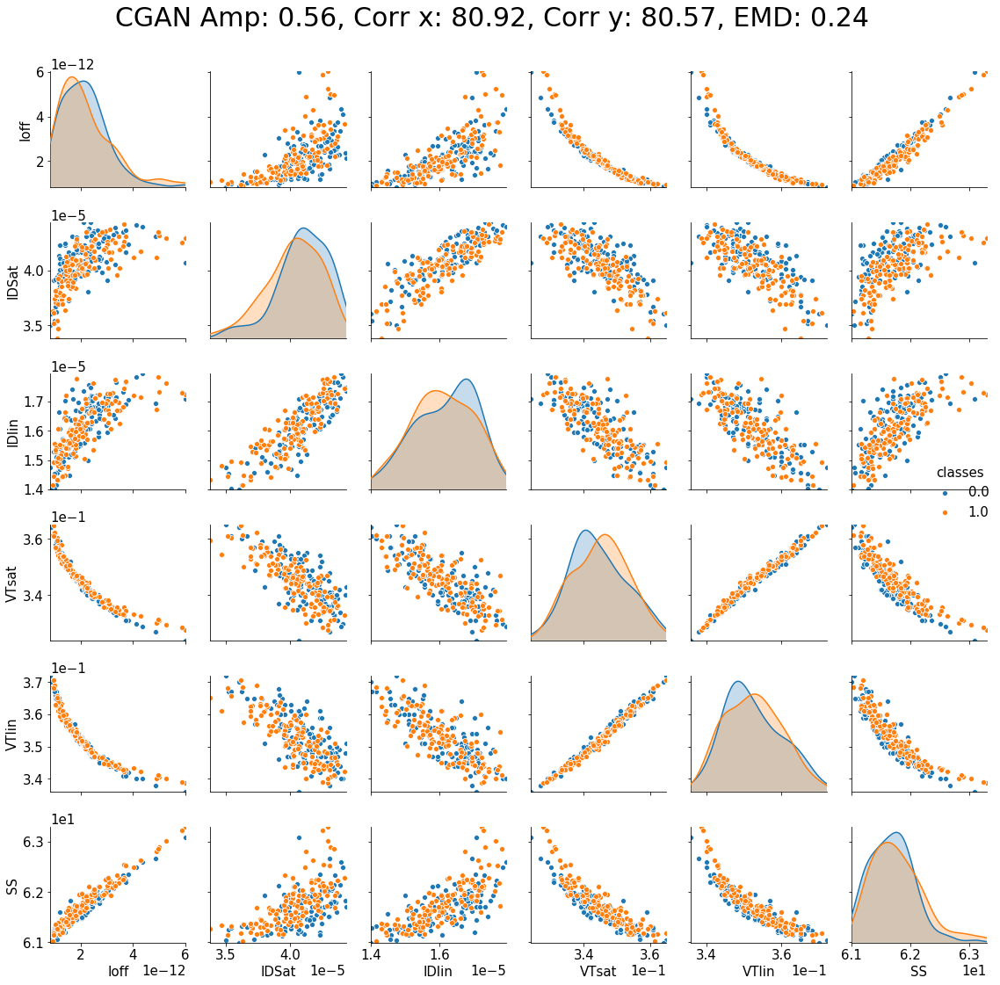

factor 2
250 375
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [7.18100000e-13 3.44300000e-05 1.42639743e-05 3.26000000e-01
 3.38000000e-01 6.10550000e+01 0.00000000e+00]
maximum y value for each varaible: [5.08200000e-12 4.49000882e-05 1.83700000e-05 3.68000000e-01
 3.74000000e-01 6.28665872e+01 1.00000000e+00]
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


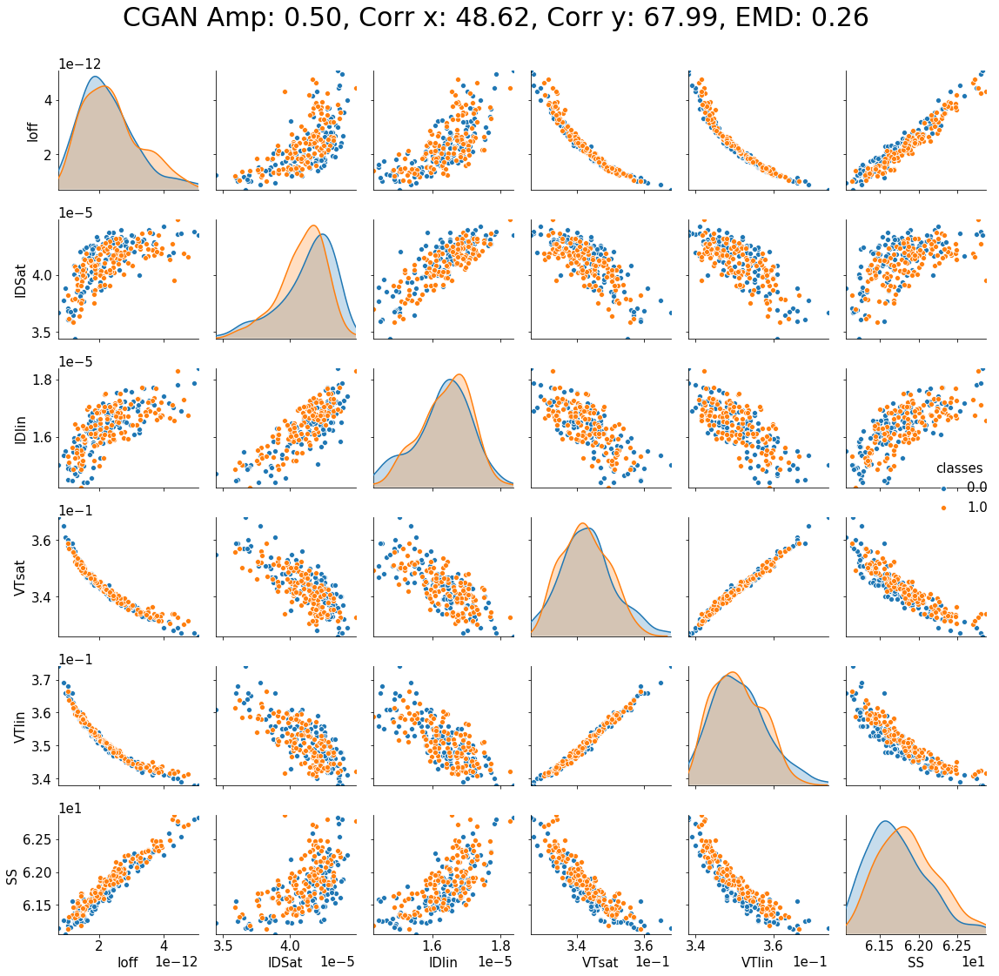

factor 3
375 500
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [5.98800000e-13 3.22190547e-05 1.32100000e-05 3.23757305e-01
 3.36702868e-01 6.08810000e+01 0.00000000e+00]
maximum y value for each varaible: [6.96282120e-12 4.44400000e-05 1.80100000e-05 3.72216091e-01
 3.79309215e-01 6.35672854e+01 1.00000000e+00]
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


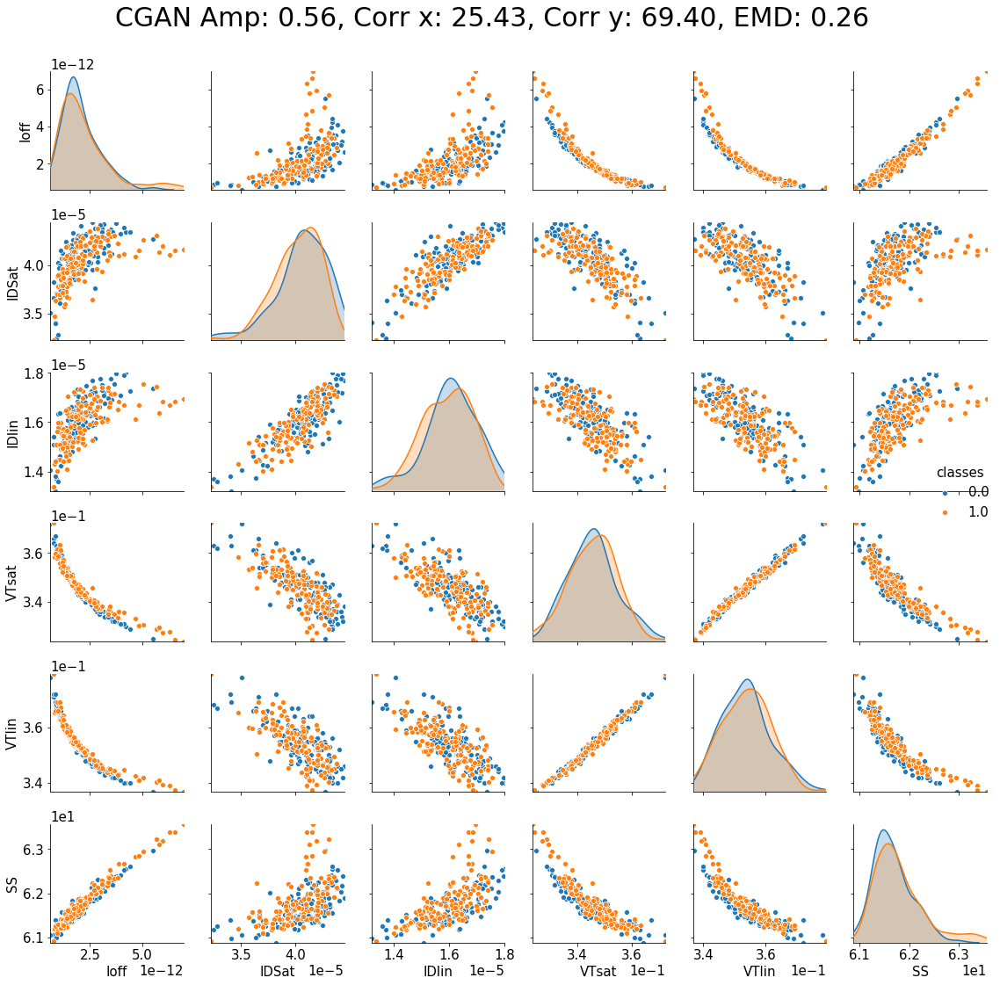

factor 4
500 625
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [6.73242283e-13 3.24972898e-05 1.29927382e-05 3.20547201e-01
 3.34479156e-01 6.08760000e+01 0.00000000e+00]
maximum y value for each varaible: [7.97410720e-12 4.47749600e-05 1.81500000e-05 3.72536375e-01
 3.78689771e-01 6.38405547e+01 1.00000000e+00]
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


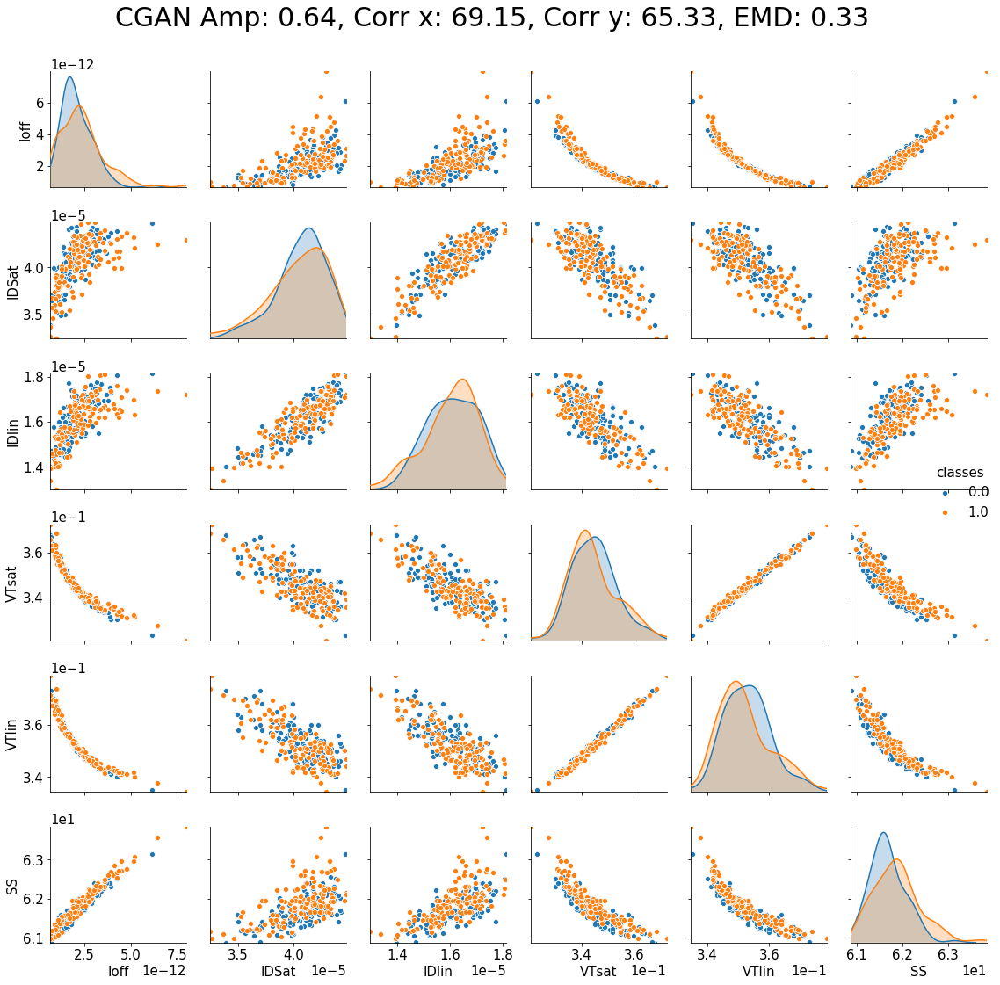

factor 5
625 750
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [4.38762645e-13 3.11277675e-05 1.26686227e-05 3.18000000e-01
 3.30000000e-01 6.09350000e+01 0.00000000e+00]
maximum y value for each varaible: [8.33700000e-12 4.59000000e-05 1.86000000e-05 3.74326415e-01
 3.77794859e-01 6.38930000e+01 1.00000000e+00]
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


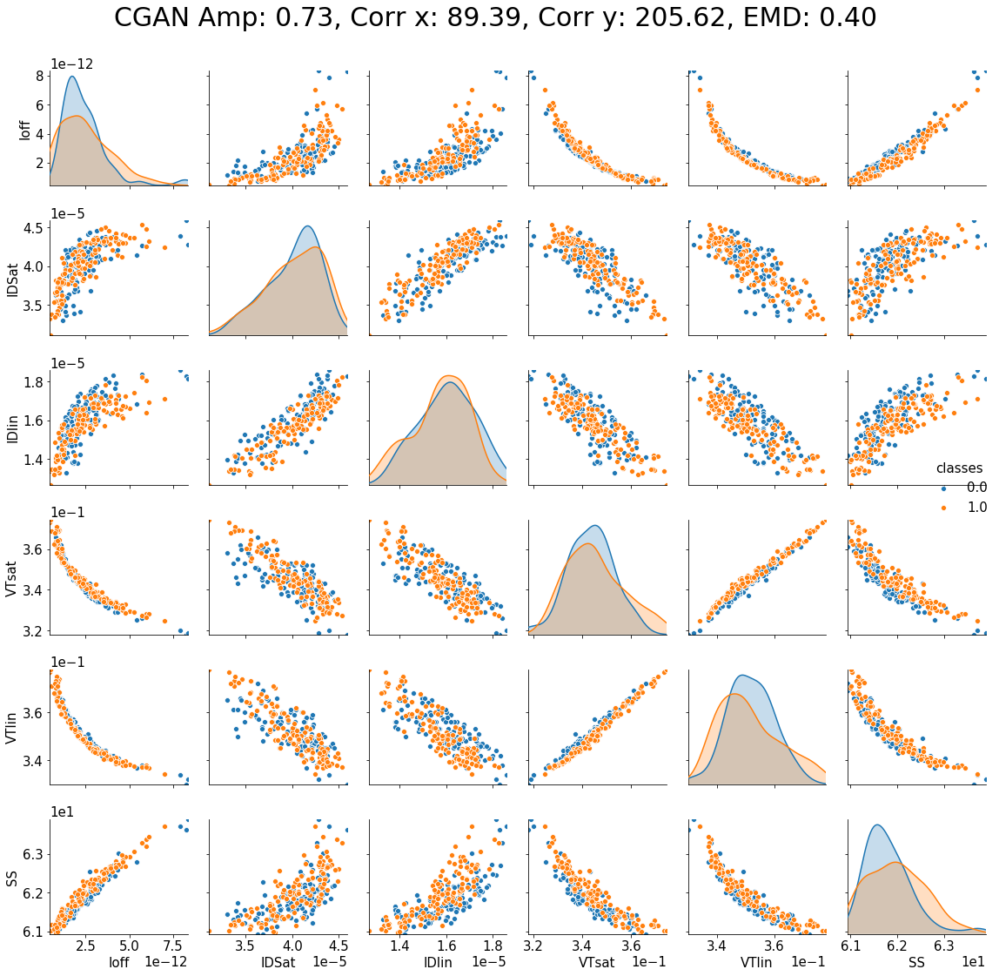

factor 6
750 875
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [1.66417410e-12 4.12100000e-05 1.58400000e-05 3.35563320e-01
 3.43887788e-01 6.13730000e+01 0.00000000e+00]
maximum y value for each varaible: [3.00006864e-12 4.39300000e-05 1.73375904e-05 3.47474005e-01
 3.54000000e-01 6.20528060e+01 1.00000000e+00]
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


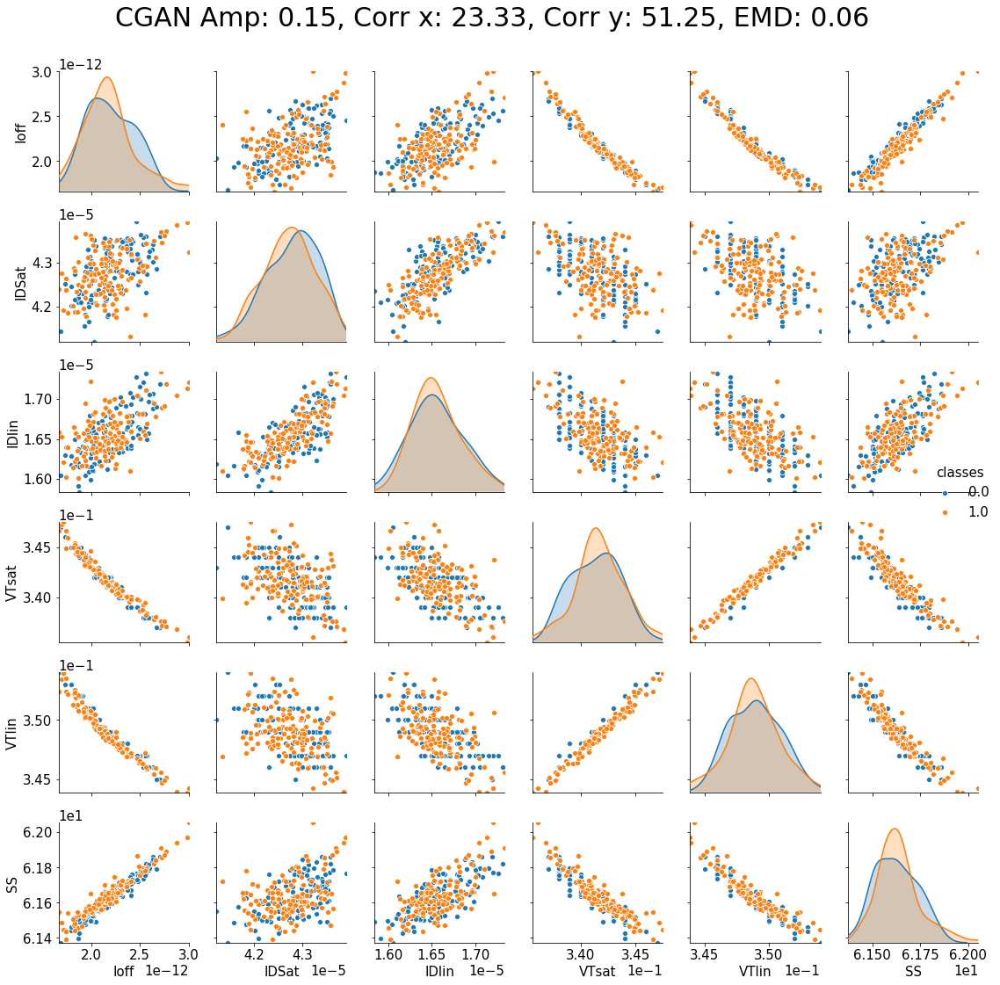

factor 7
875 1000
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [6.67800000e-13 2.91093188e-05 1.28400000e-05 3.23000000e-01
 3.35000000e-01 6.09080000e+01 0.00000000e+00]
maximum y value for each varaible: [7.52863098e-12 4.56800000e-05 1.87500000e-05 3.71000000e-01
 3.76000000e-01 6.39026715e+01 1.00000000e+00]
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


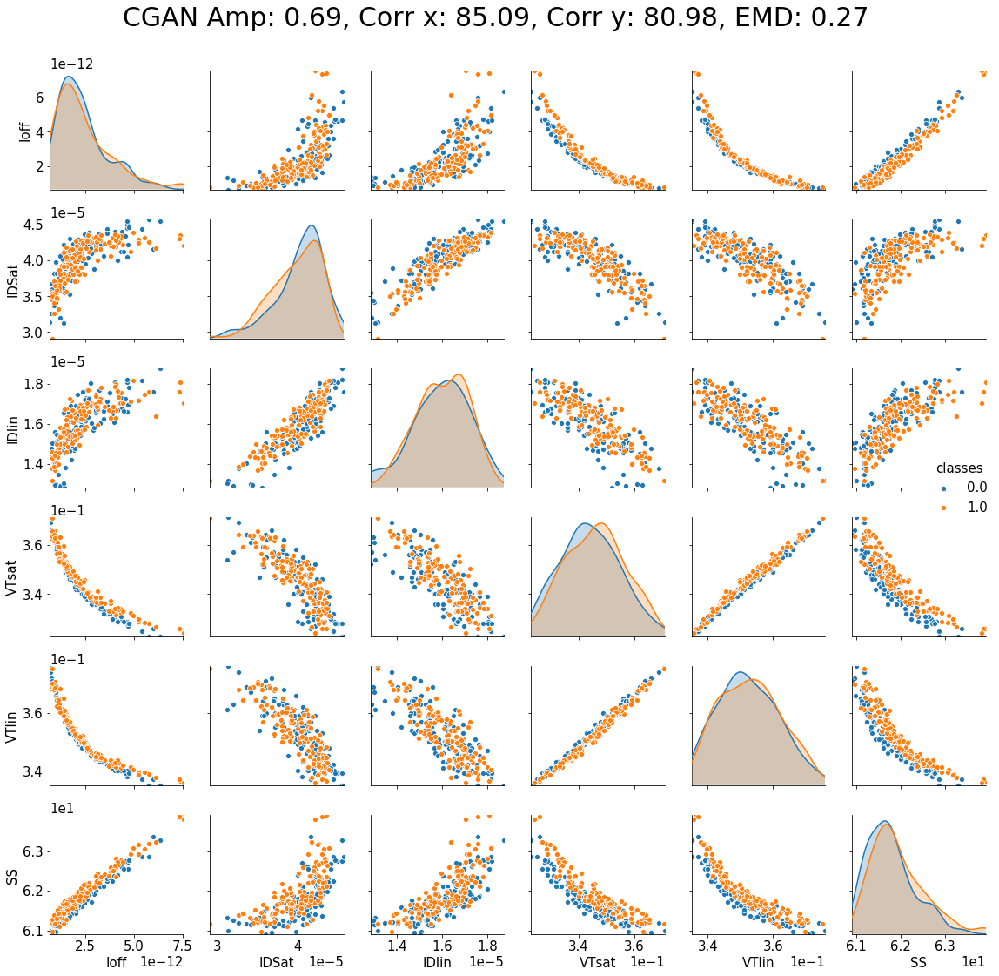

factor 8
1000 1125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [1.46300000e-12 3.94679378e-05 1.53400000e-05 3.33000000e-01
 3.42000000e-01 6.12830000e+01 0.00000000e+00]
maximum y value for each varaible: [3.48000000e-12 4.45600000e-05 1.74400000e-05 3.50334653e-01
 3.57000000e-01 6.21800000e+01 1.00000000e+00]
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


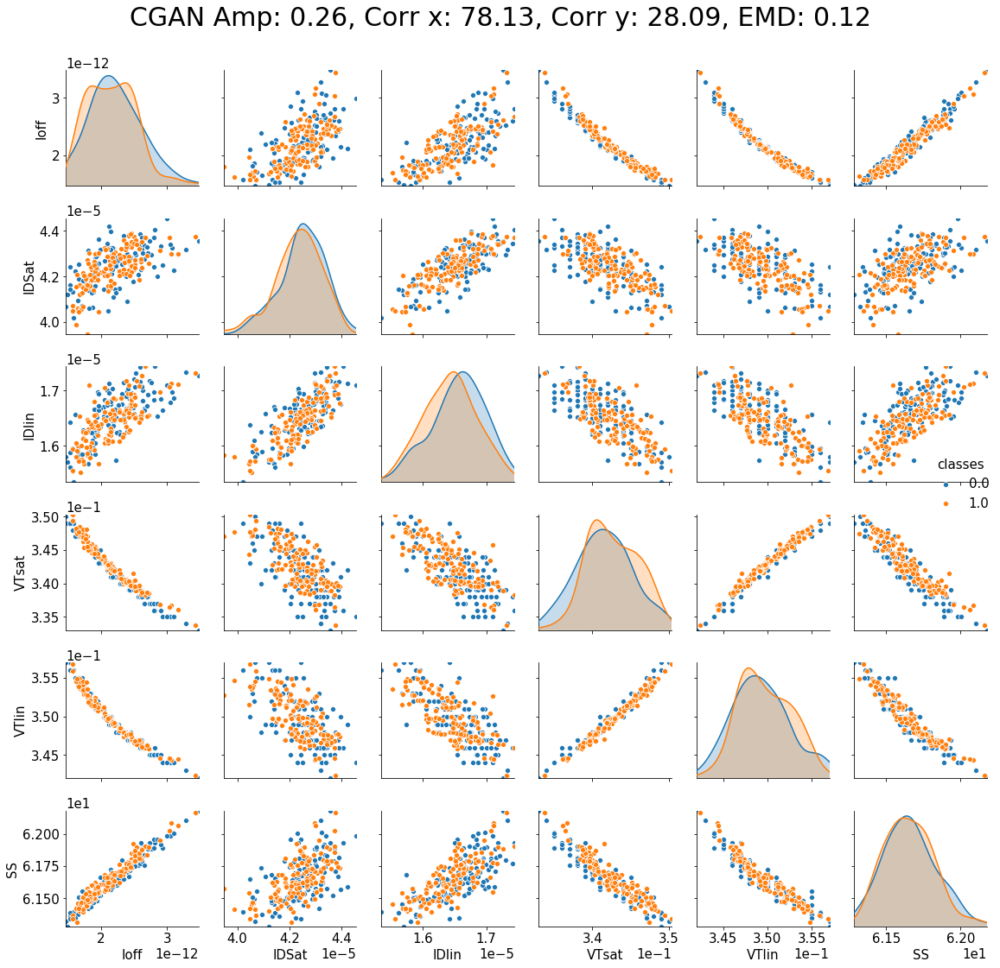

factor 9
1125 1250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
minimum y value for each varaible: [1.56600000e-12 4.15821937e-05 1.56654668e-05 3.35967969e-01
 3.44000000e-01 6.13720000e+01 0.00000000e+00]
maximum y value for each varaible: [2.91813313e-12 4.44300000e-05 1.72600000e-05 3.49000000e-01
 3.55000000e-01 6.19625500e+01 1.00000000e+00]
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


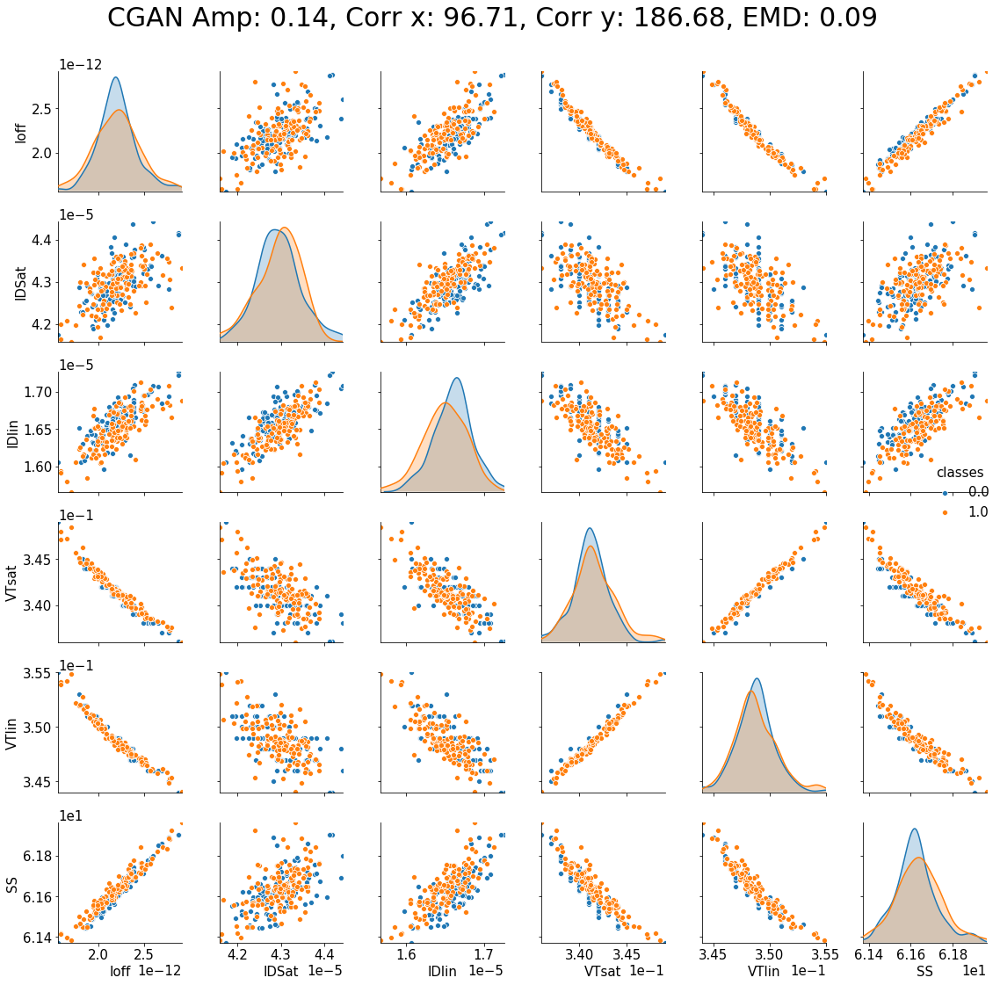

In [59]:
# gen_factor = 7
# test_sample_num = int(total_result_test.shape[0]/15)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]

for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle_half[:factor]),sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor])
    test_gan_matrix_plot = test_gen[factor * test_gen_sample_num:(factor+1)*test_gen_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = A_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((test_gen_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle_half[factor], 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
        # min, max for generated Y value ( used for scatter plot limit standard )

    test_min_list = total_test_matrix_plot.min(axis=0)
    test_max_list = total_test_matrix_plot.max(axis=0)
    print("minimum y value for each varaible:", test_min_list)
    print("maximum y value for each varaible:", test_max_list)

    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.2f}, Corr x: {:.2f}, Corr y: {:.2f}, EMD: {:.2f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
        g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))

    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')

    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/Gen_Test_Custom_factor_{}_sample_{}.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()


    ### 파란색이 real 주황색이 generated

# 2. Same scale

factor 0
0 125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


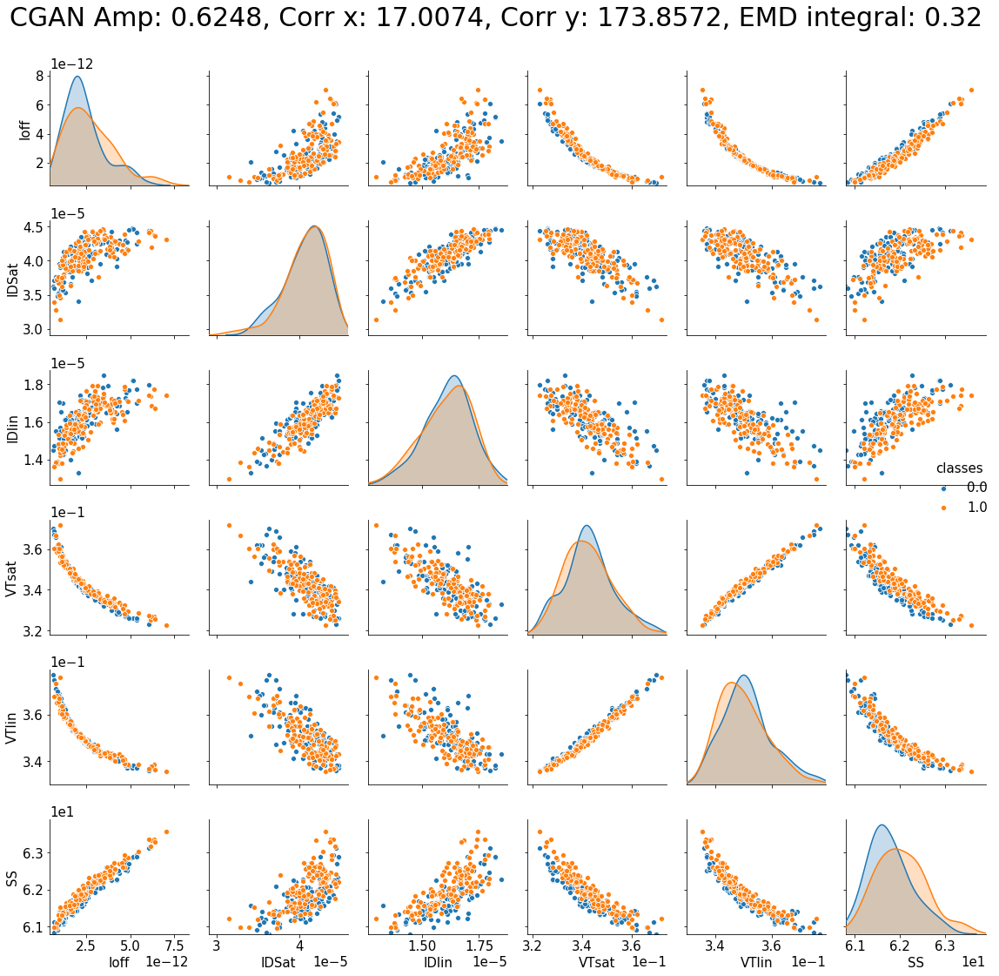

factor 1
125 250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


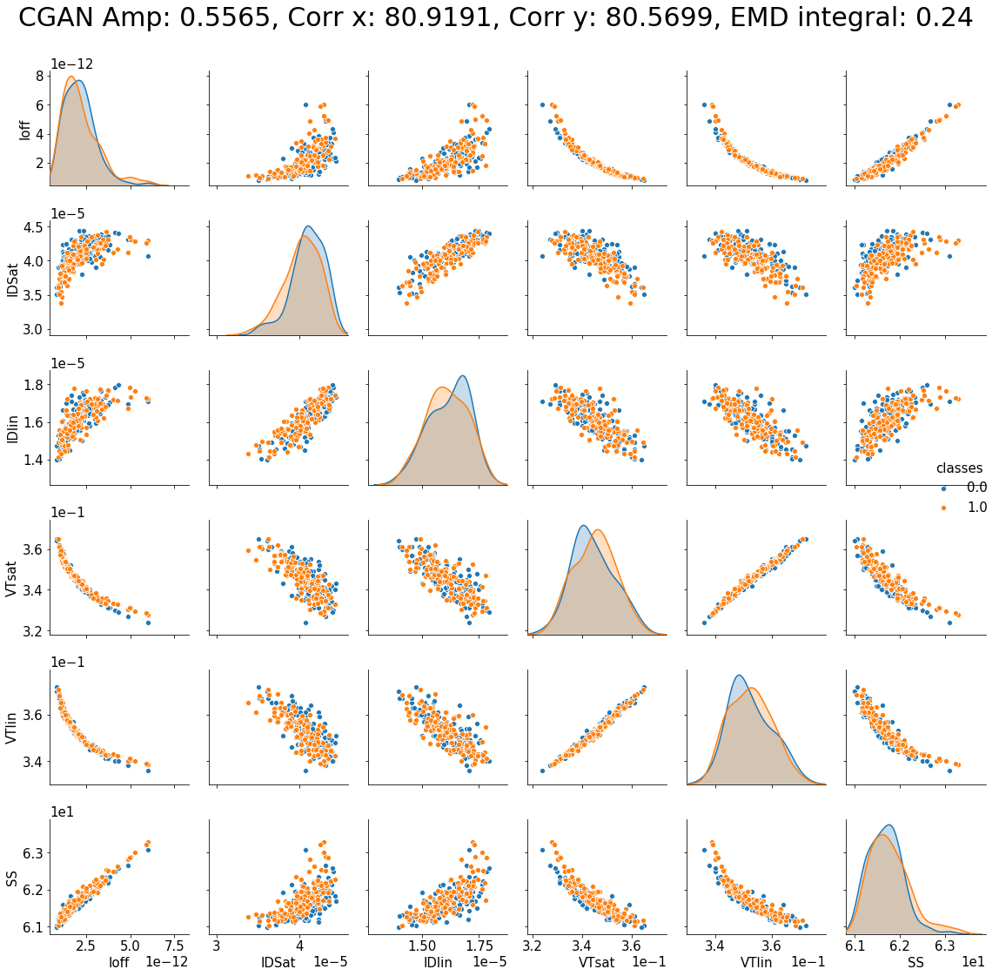

factor 2
250 375
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


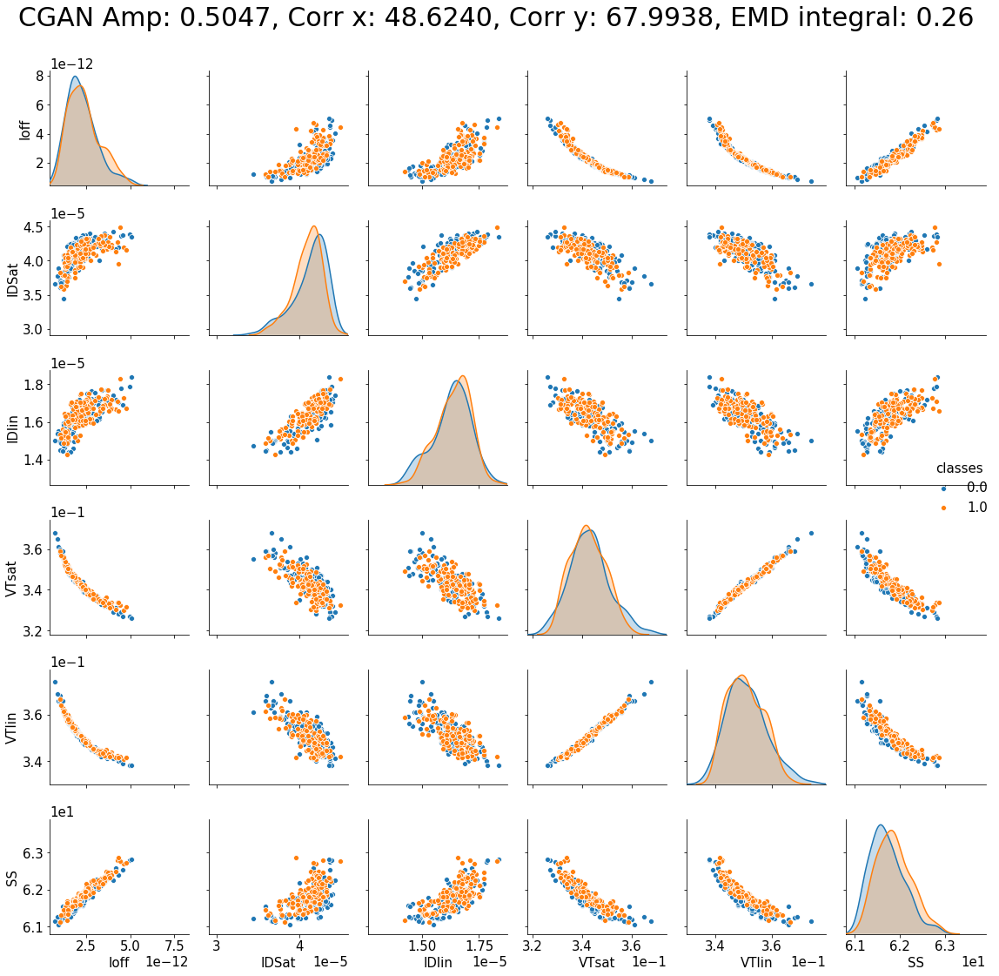

factor 3
375 500
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


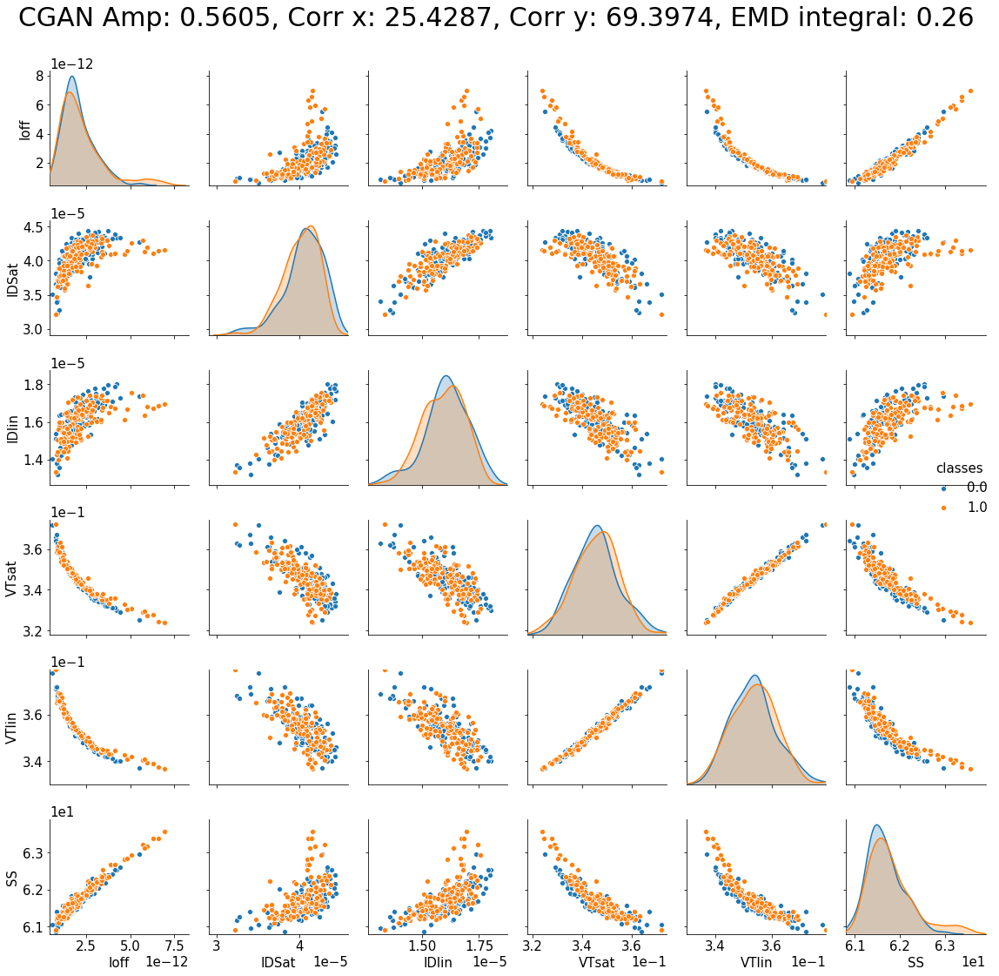

factor 4
500 625
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


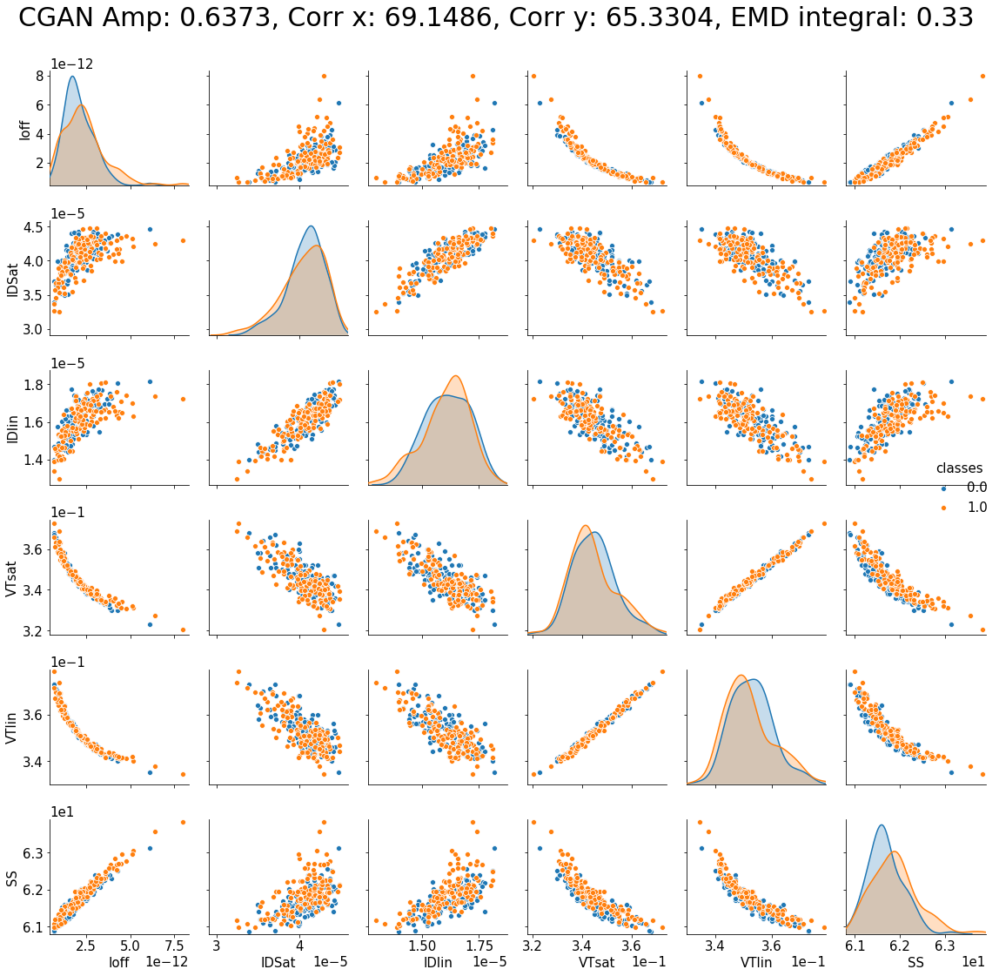

factor 5
625 750
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


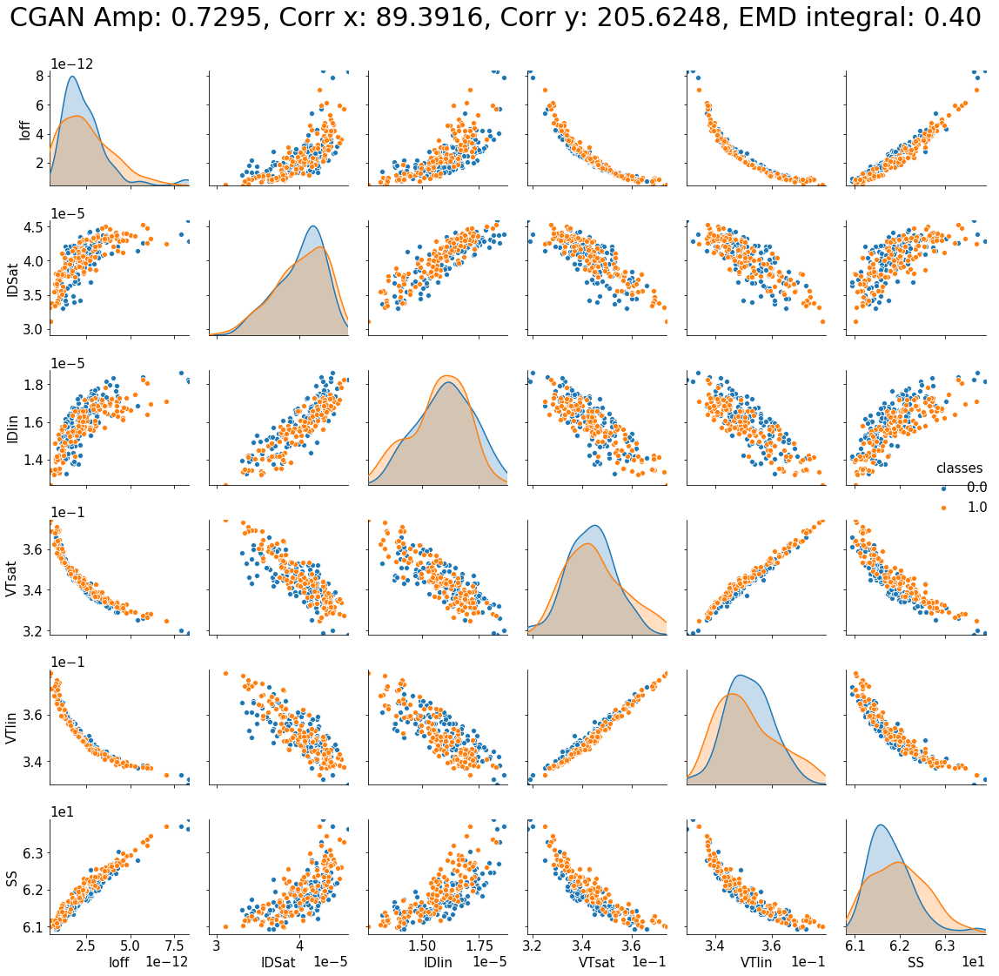

factor 6
750 875
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


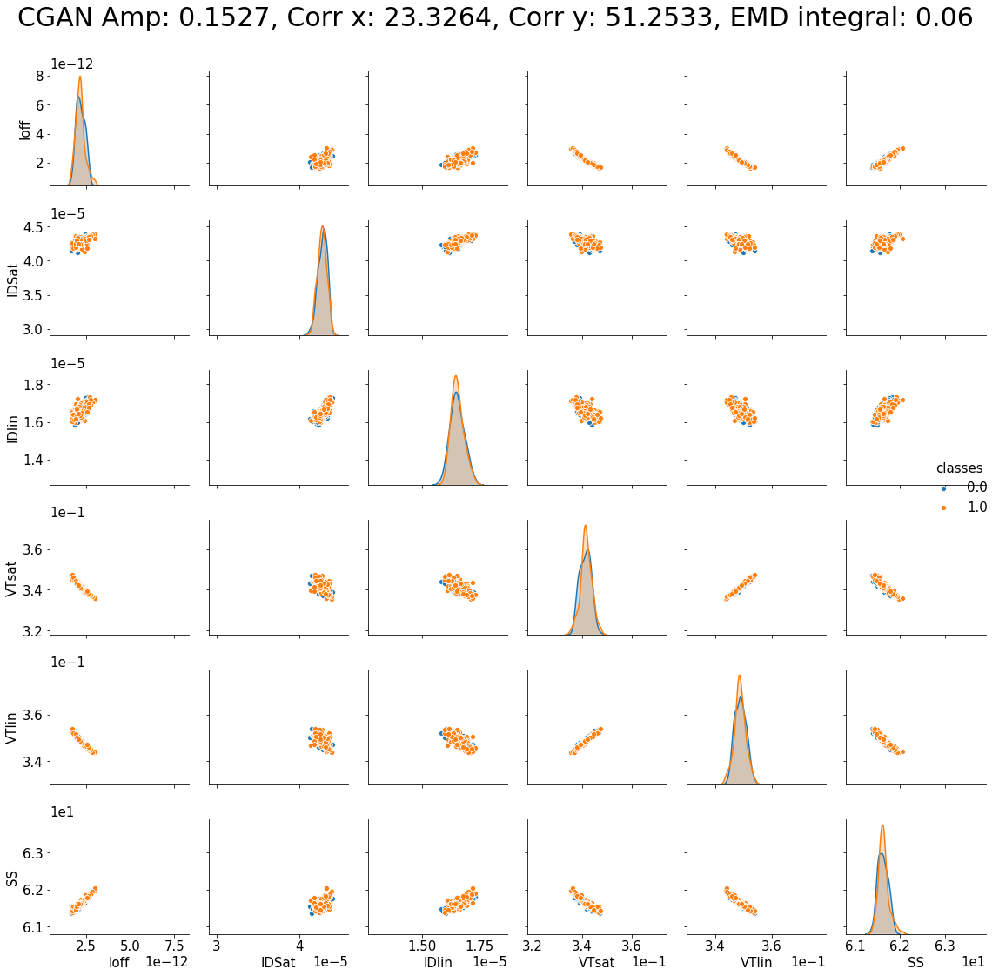

factor 7
875 1000
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


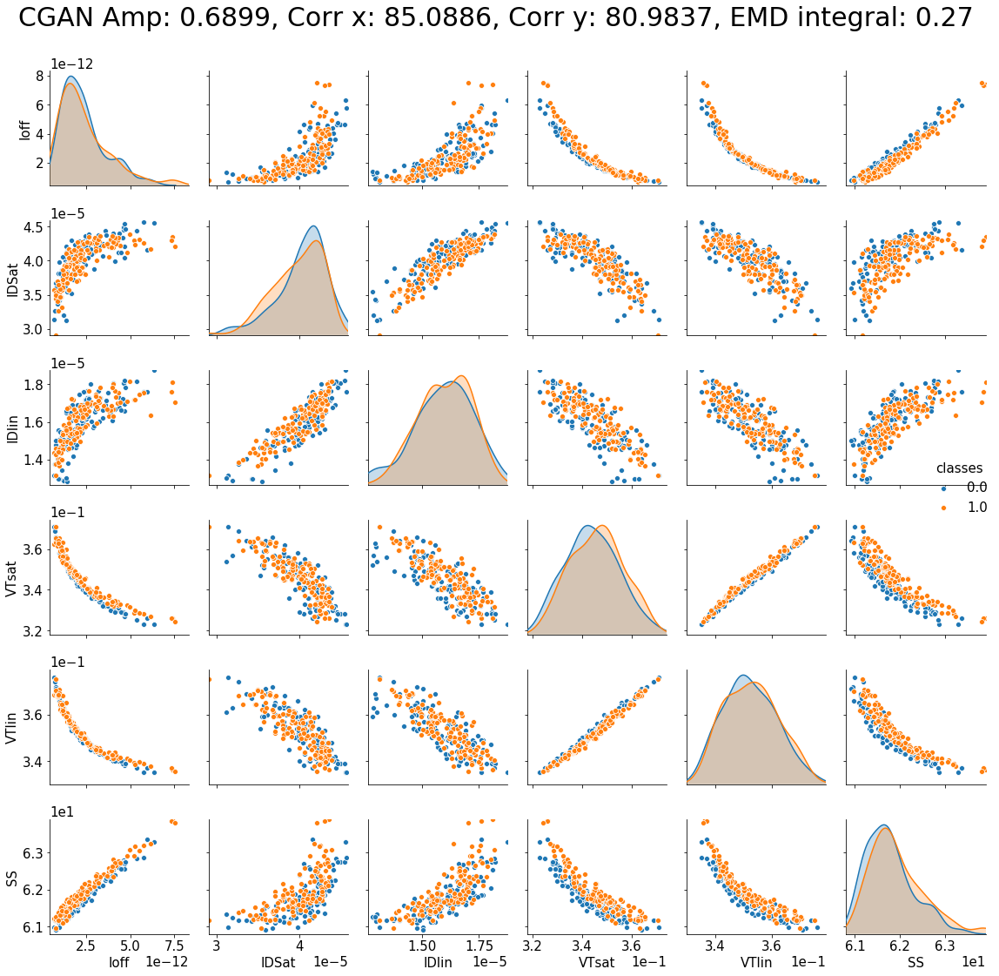

factor 8
1000 1125
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


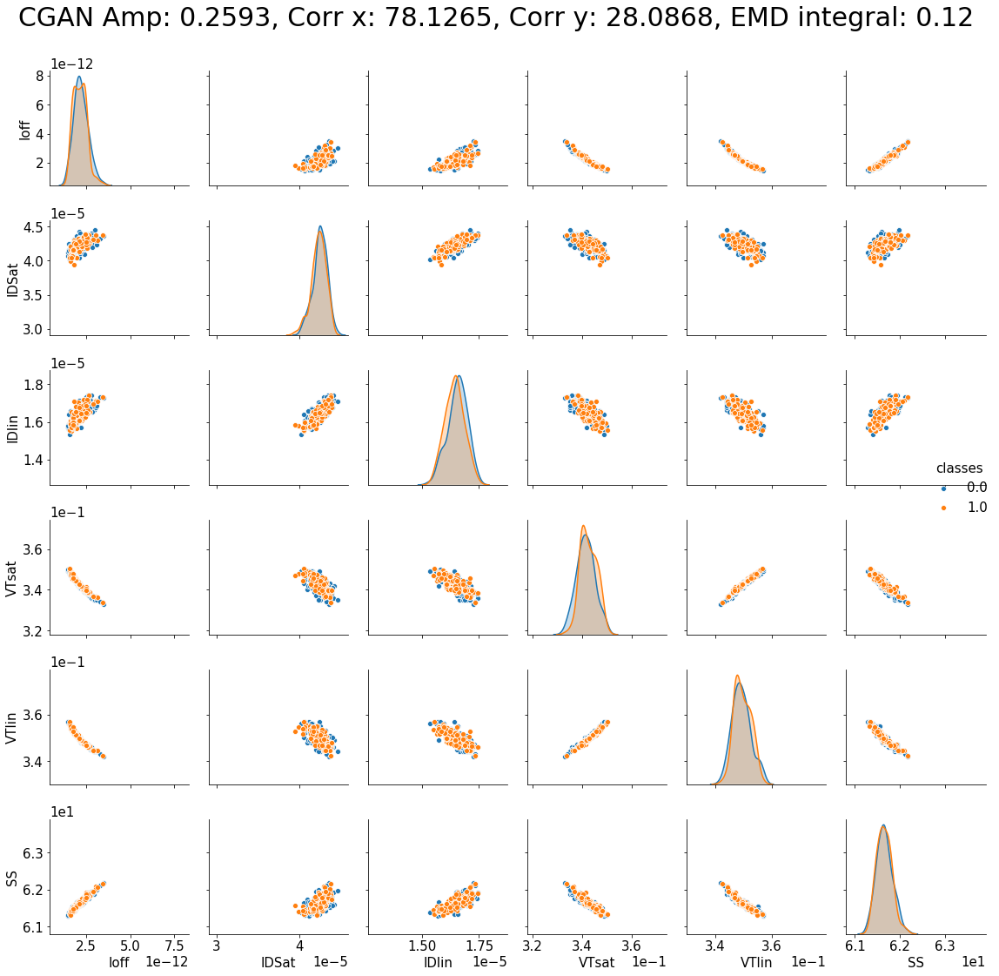

factor 9
1125 1250
Generated sample shape: (125, 6)
real sample shape: (125, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (125, 1)
real sample class shape: (125, 1)
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


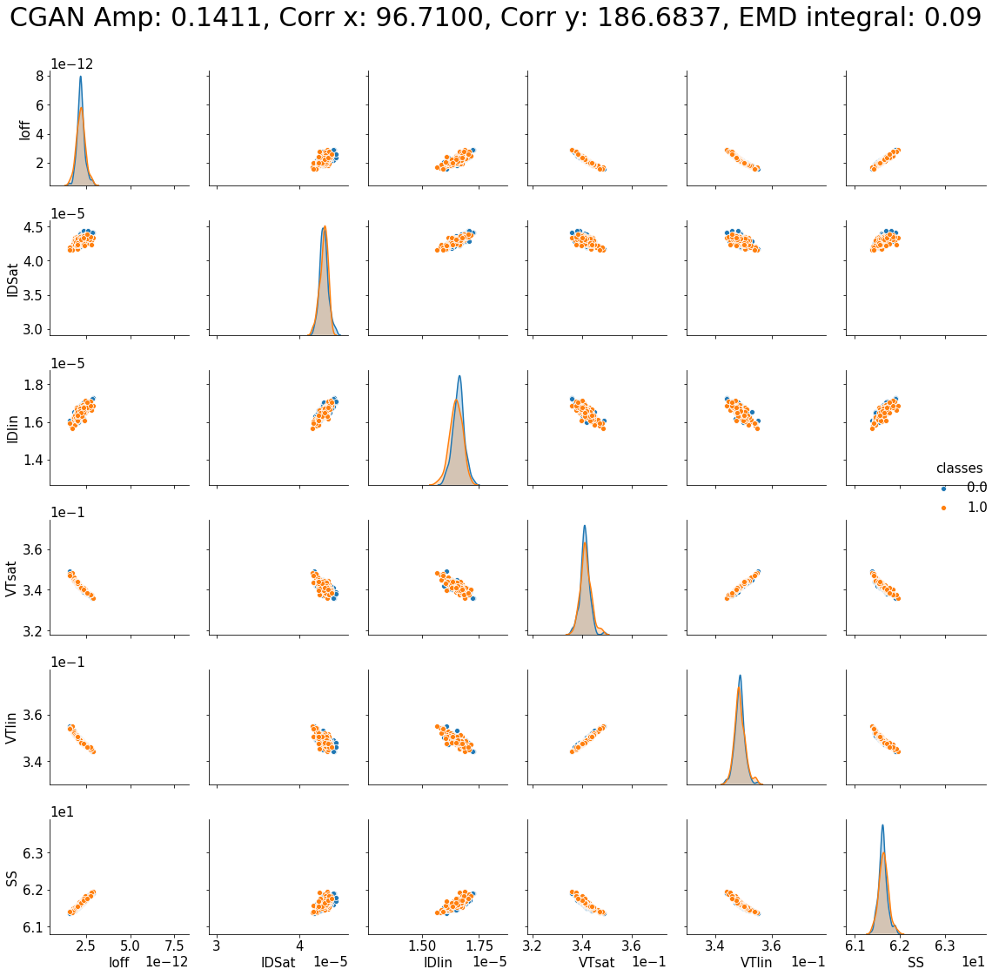

In [60]:
for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle_half[:factor]),sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor])
    test_gan_matrix_plot = test_gen[factor * test_gen_sample_num:(factor+1)*test_gen_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = A_test_real[sum(num_in_cycle_half[:factor]):sum(num_in_cycle_half[:factor])+num_in_cycle_half[factor]]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((test_gen_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle_half[factor], 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)
    
#     print(np.min(test_min_list))
#     print(np.max(test_max_list, axis=1))
    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}, EMD integral: {:.2f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((min_per_out_v[i], max_per_out_v[i]))
        g.axes[i,i].set_ylim((min_per_out_v[i], max_per_out_v[i]))
    
    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')
    
    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/Gen_Test_same_factor_{}_sample_{}.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()
    
    ### 파란색이 real 주황색이 generated

In [ ]:
# 아래는 250개씩

# GENERATED DATA
### Please put your sampled data file(in .npy) in the same directory

In [3]:
########################################  CHANGE HERE ####################################################################

result = 'test_specificdate_201101_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_200_50_batch_size_32_noise_d_100_sample_num_250_tr_num_in_cycle_50_pdrop_0.5.npy'

# mean 상수 변경 전 test_specificdate_201101_data_2020_LER_20201008_V008.xlsx_model_mlp_gan2_seed_0_lr_5e-05_0.0001_0.0005_hidden_dim_200_50_batch_size_32_noise_d_100_sample_num_250_tr_num_in_cycle_50_pdrop_0.5.npy



##########################################################################################################################

test_gen = np.load(result, allow_pickle=True)

num_of_cycle = 10


test_gen_sample_num = int(test_gen.shape[0]/num_of_cycle)

print("test data sample num", test_gen_sample_num)
print("test data shape", test_gen.shape)


test data sample num 250
test data shape (2500, 6)


# SCALE

In [4]:
min1_per_out_v = test_real.min(axis=0)
max1_per_out_v = test_real.max(axis=0)
print("minimum y value for each varaible:", min1_per_out_v)
print("maximum y value for each varaible:", max1_per_out_v)

min2_per_out_v = test_gen.min(axis=0)
max2_per_out_v = test_gen.max(axis=0)
print("minimum y value for each varaible:", min2_per_out_v)
print("maximum y value for each varaible:", max2_per_out_v)

min_per_out_v = np.minimum(min1_per_out_v, min2_per_out_v)
max_per_out_v = np.maximum(max1_per_out_v, max2_per_out_v)

minimum y value for each varaible: [3.0220e-13 2.6090e-05 1.1500e-05 3.1800e-01 3.3000e-01 6.0765e+01]
maximum y value for each varaible: [8.3370e-12 4.5900e-05 1.8750e-05 3.9400e-01 3.9700e-01 6.3893e+01]
minimum y value for each varaible: [5.08358761e-13 3.00277724e-05 1.15866551e-05 3.20748842e-01
 3.32077404e-01 6.06108804e+01]
maximum y value for each varaible: [6.58160327e-12 4.48985853e-05 1.87230282e-05 3.81598018e-01
 3.82810211e-01 6.32338323e+01]


# EMD pdf

In [9]:
# # EMD  

# EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_pdf(generated_samples = test_gen, real_samples = test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=[test_gen_sample_num]*num_of_cycle, num_in_real_list = num_in_cycle) 

# print(EMD_1d_score_list.shape)
# print(EMD_2d_score_list.shape)

# EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

# EMD_score = np.mean(EMD_score_cat)
# EMD_score_list_pdf = np.mean(EMD_score_cat,axis=1)
# EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_pdf)**2))

# for i in range(len(EMD_score_list_pdf)):
#     print("EMD_score for each X factor {} \t score {:5f} \t dev {:5f}".format(i, EMD_score_list_pdf[i], (EMD_score_list_pdf[i]-EMD_score)/EMD_std))
# # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classs

# EMD_score_list = np.array(EMD_score_list_pdf)
 
# print("EMD argsort: ", EMD_score_list.argsort())
# print("EMD score: ", EMD_score)



# EMD integral

In [5]:
# EMD  

EMD_1d_score_list, EMD_2d_score_list = sample_utils.EMD_all_pair_each_X_integral(generated_samples = test_gen, real_samples = test_real, num_coordinate=10, num_of_cycle=num_of_cycle, num_in_gen_list=[test_gen_sample_num]*num_of_cycle, num_in_real_list = num_in_cycle, min_list = min_per_out_v, max_list = max_per_out_v) 

print(EMD_1d_score_list.shape)
print(EMD_2d_score_list.shape)

EMD_score_cat = np.hstack((EMD_1d_score_list, EMD_2d_score_list))

EMD_score = np.mean(EMD_score_cat)
EMD_score_list_integral = np.mean(EMD_score_cat,axis=1)
EMD_std = np.sqrt(np.mean((EMD_score - EMD_score_list_integral)**2))

for i in range(len(EMD_score_list_integral)):
    print("EMD_score for each X factor {} \t score {:5f} \t dev {:5f}".format(i, EMD_score_list_integral[i], (EMD_score_list_integral[i]-EMD_score)/EMD_std))
# A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classs

EMD_score_list = np.array(EMD_score_list_integral)
print("EMD score: ", EMD_score)

 
print("EMD argsort: ", EMD_score_list.argsort())

(10, 6)
(10, 15)
EMD_score for each X factor 0 	 score 0.163296 	 dev -0.774121
EMD_score for each X factor 1 	 score 0.340947 	 dev 1.884272
EMD_score for each X factor 2 	 score 0.218922 	 dev 0.058274
EMD_score for each X factor 3 	 score 0.172360 	 dev -0.638475
EMD_score for each X factor 4 	 score 0.284070 	 dev 1.033152
EMD_score for each X factor 5 	 score 0.282505 	 dev 1.009736
EMD_score for each X factor 6 	 score 0.132300 	 dev -1.237942
EMD_score for each X factor 7 	 score 0.245697 	 dev 0.458943
EMD_score for each X factor 8 	 score 0.155724 	 dev -0.887429
EMD_score for each X factor 9 	 score 0.154455 	 dev -0.906410
EMD score:  0.2150275764687519
EMD argsort:  [6 9 8 0 3 2 7 5 4 1]


# GEN / REAL ( 개당 250개, 8set ) Pair plot

# 1. Custom scale


factor 0
0 250
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [4.74700000e-13 3.18200000e-05 1.28365937e-05 3.22597797e-01
 3.33280366e-01 6.06108804e+01 0.00000000e+00]
maximum y value for each varaible: [6.10000000e-12 4.48985853e-05 1.84700000e-05 3.78000000e-01
 3.82000000e-01 6.32420000e+01 1.00000000e+00]
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


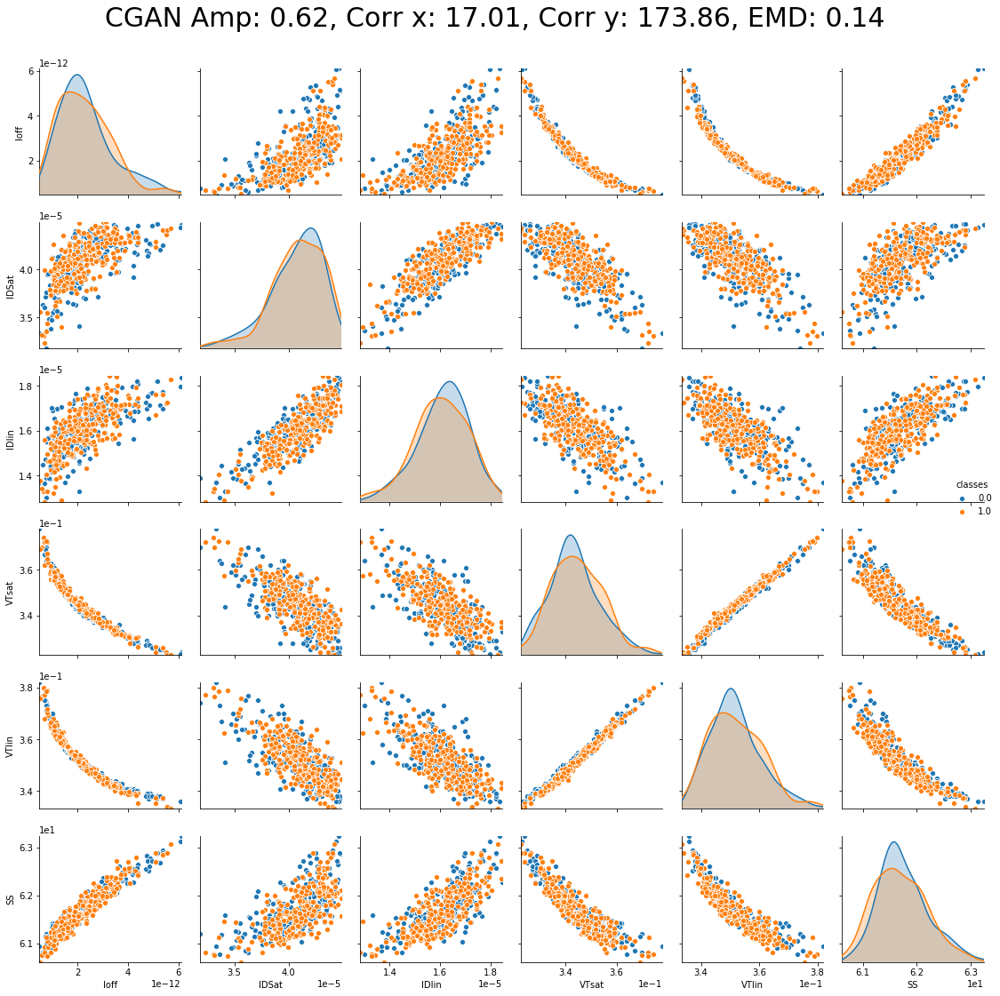

factor 1
250 500
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [6.73600000e-13 3.11164004e-05 1.35500000e-05 3.24000000e-01
 3.35357965e-01 6.08361089e+01 0.00000000e+00]
maximum y value for each varaible: [6.00900000e-12 4.50700000e-05 1.87230282e-05 3.70036426e-01
 3.76000000e-01 6.30910000e+01 1.00000000e+00]
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


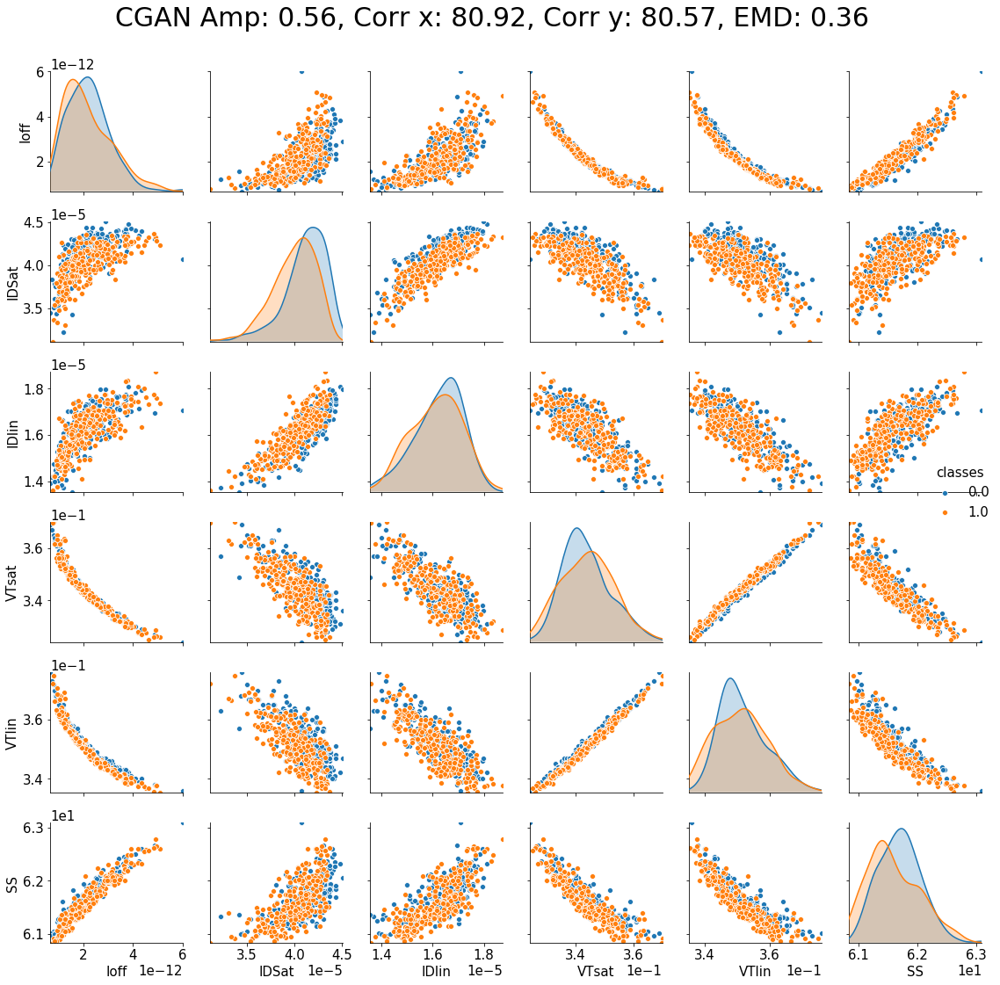

factor 2
500 750
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [7.18100000e-13 3.34900000e-05 1.35897683e-05 3.23970315e-01
 3.35745757e-01 6.09860000e+01 0.00000000e+00]
maximum y value for each varaible: [5.50591742e-12 4.45724295e-05 1.85104987e-05 3.68000000e-01
 3.74000000e-01 6.29525416e+01 1.00000000e+00]
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


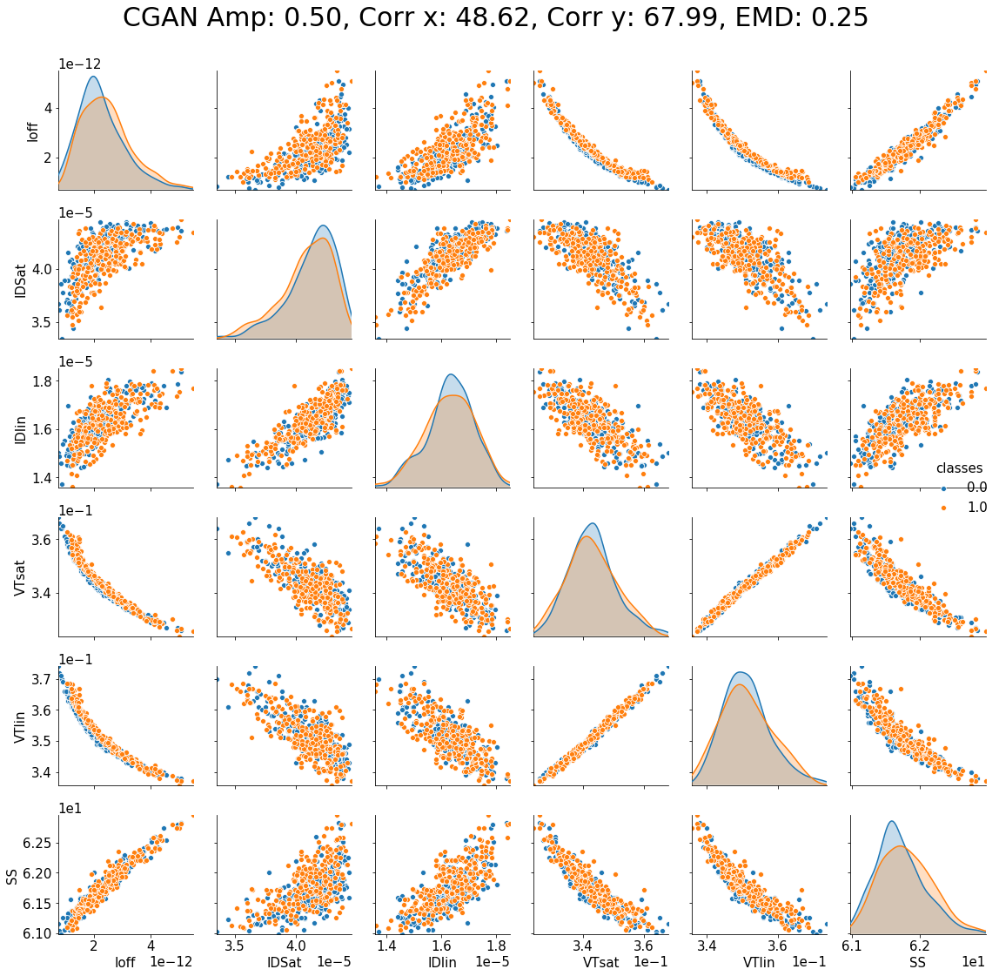

factor 3
750 1000
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [5.98800000e-13 3.16500000e-05 1.29000000e-05 3.23000000e-01
 3.35000000e-01 6.06861558e+01 0.00000000e+00]
maximum y value for each varaible: [6.0500000e-12 4.4550000e-05 1.8084278e-05 3.7300000e-01 3.7800000e-01
 6.3040000e+01 1.0000000e+00]
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


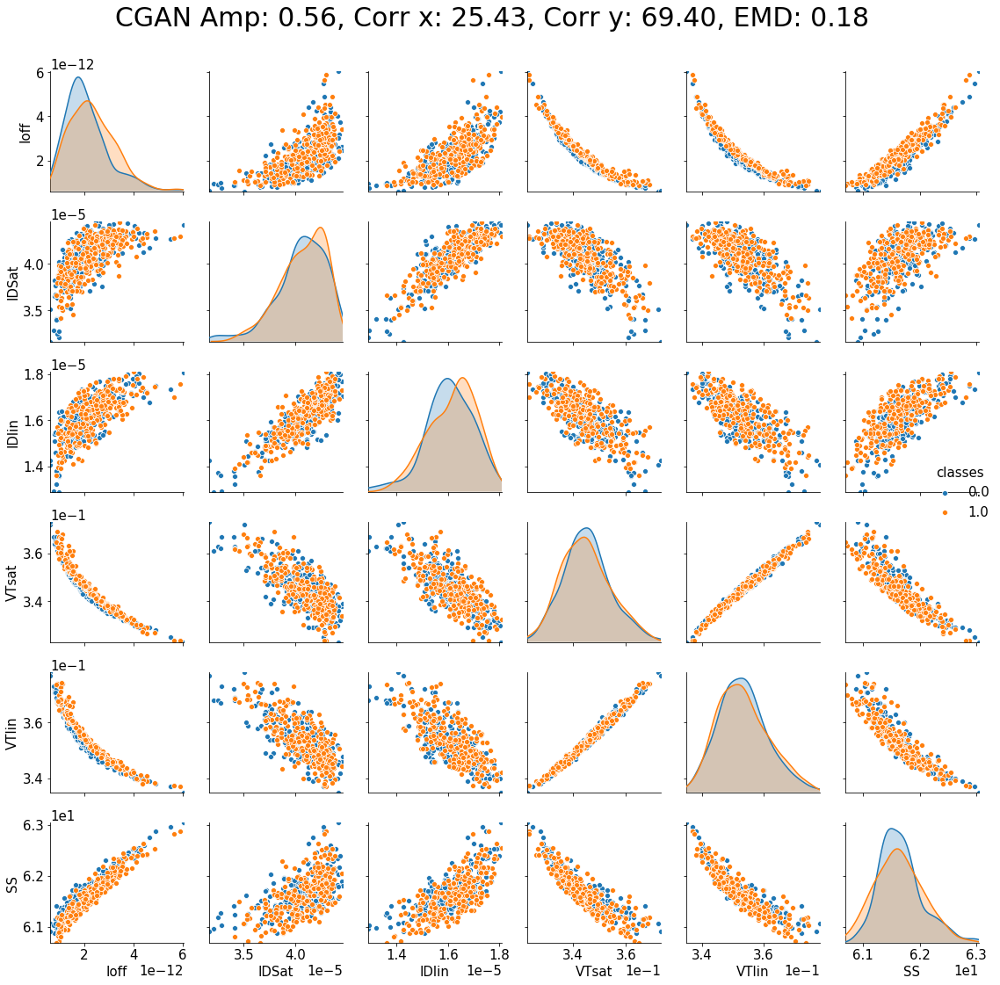

factor 4
1000 1250
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [3.02200000e-13 2.80400000e-05 1.15000000e-05 3.20748842e-01
 3.33170999e-01 6.06695187e+01 0.00000000e+00]
maximum y value for each varaible: [6.1180e-12 4.4960e-05 1.8340e-05 3.9400e-01 3.9700e-01 6.3219e+01
 1.0000e+00]
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


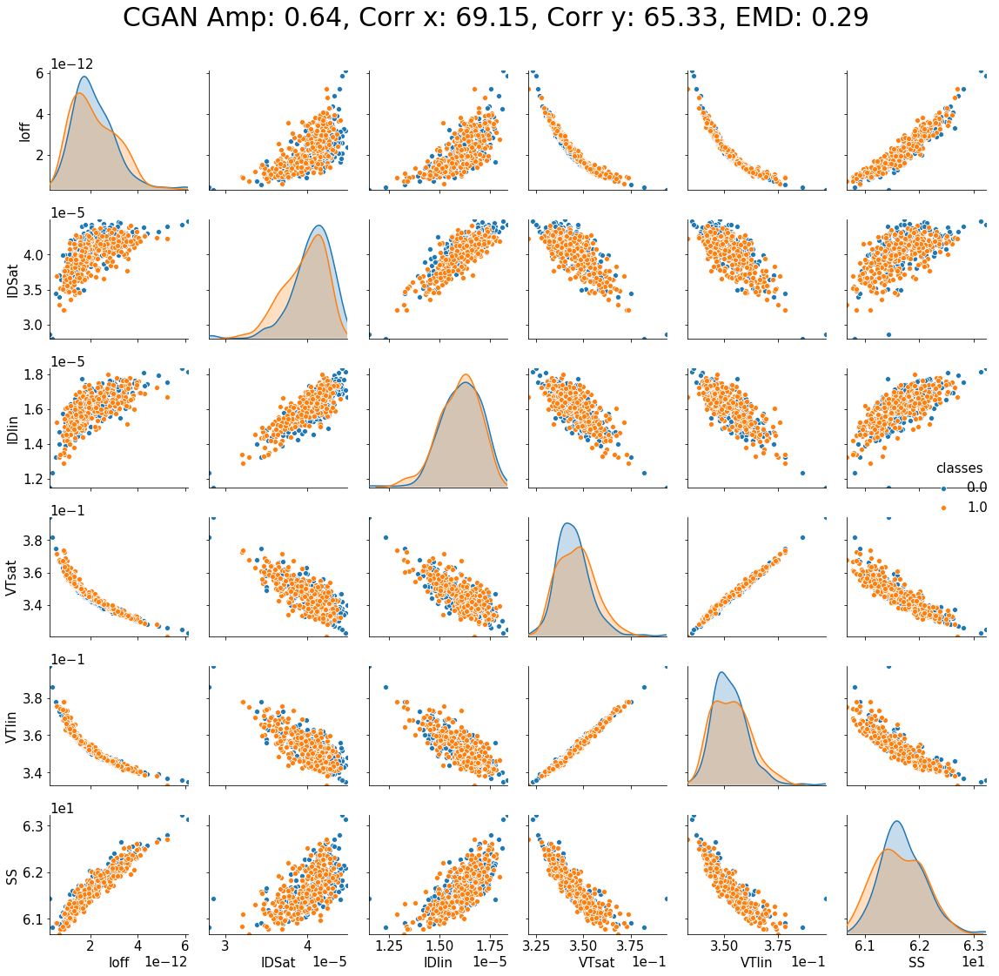

factor 5
1250 1500
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [5.22800000e-13 3.00277724e-05 1.15866551e-05 3.18000000e-01
 3.30000000e-01 6.06849636e+01 0.00000000e+00]
maximum y value for each varaible: [8.33700000e-12 4.59000000e-05 1.86000000e-05 3.81598018e-01
 3.82810211e-01 6.38930000e+01 1.00000000e+00]
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


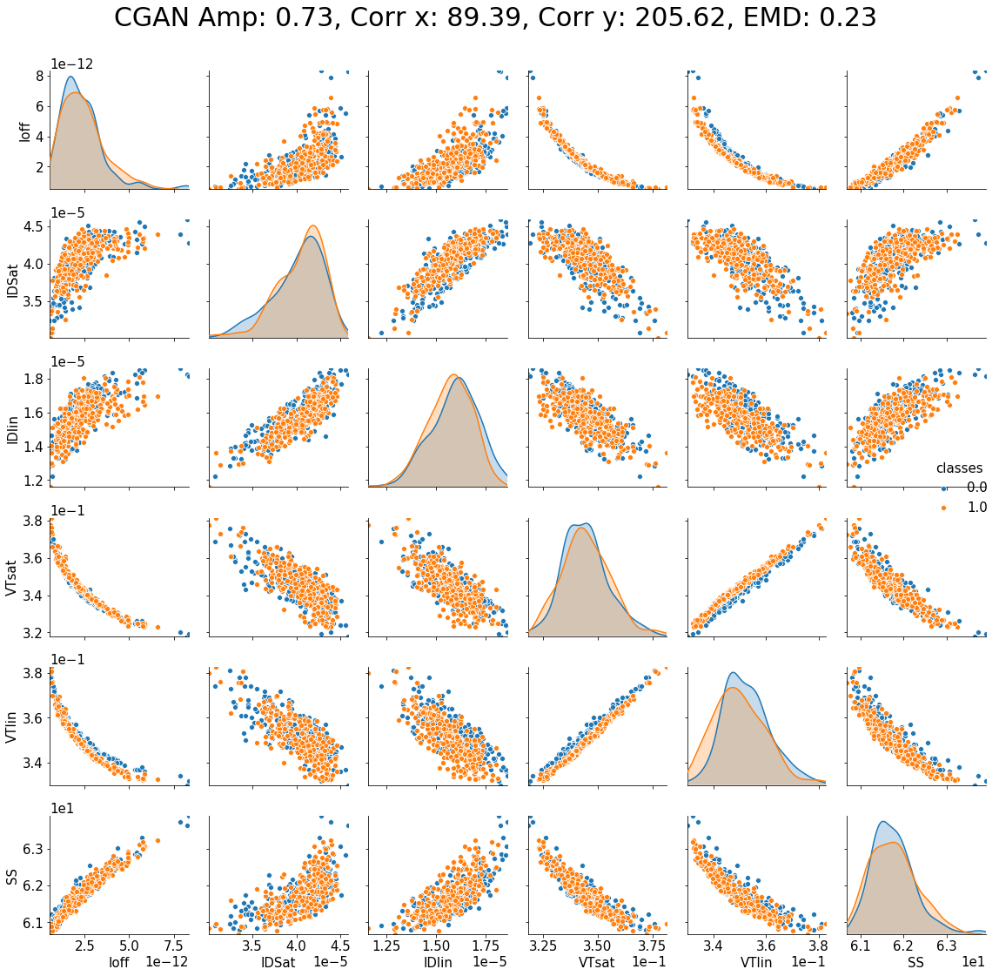

factor 6
1500 1750
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [1.36140671e-12 4.03157816e-05 1.56161167e-05 3.36000000e-01
 3.43102314e-01 6.12184840e+01 0.00000000e+00]
maximum y value for each varaible: [2.86160487e-12 4.42814632e-05 1.74285308e-05 3.50961645e-01
 3.55636906e-01 6.18937905e+01 1.00000000e+00]
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


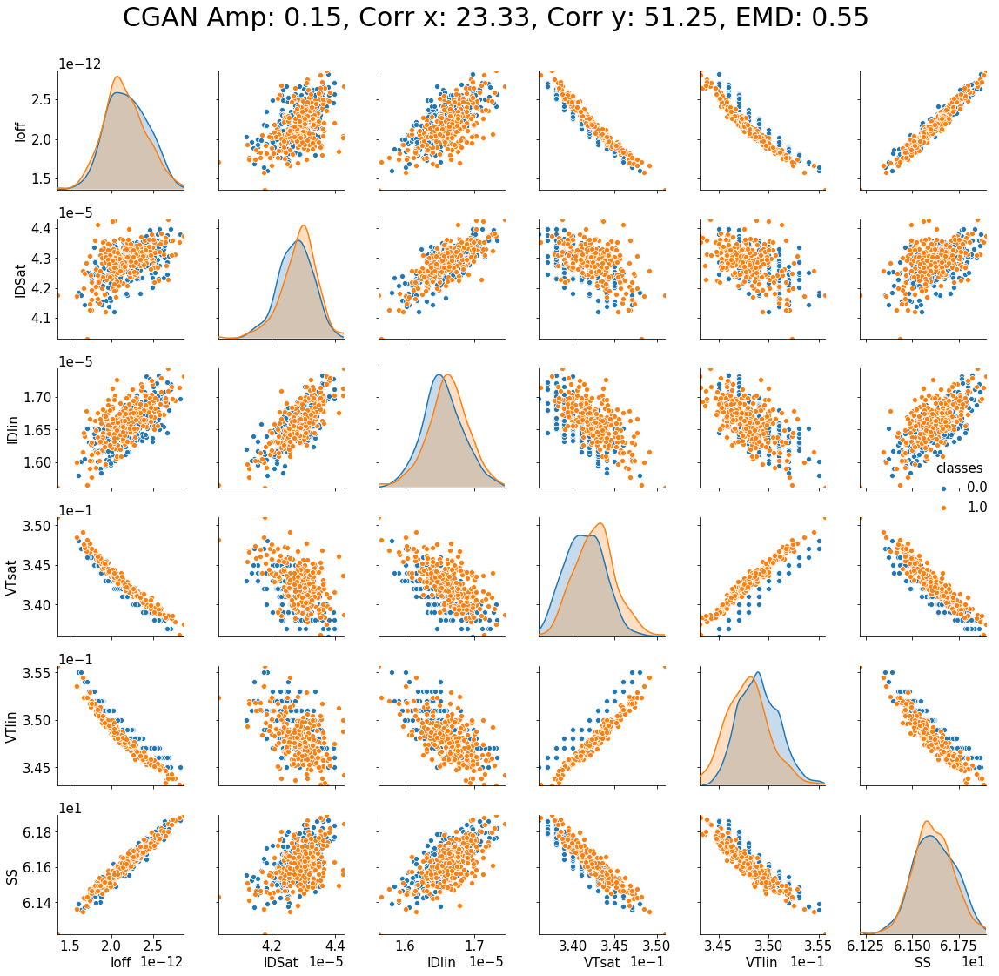

factor 7
1750 2000
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [4.14400000e-13 2.60900000e-05 1.19700000e-05 3.23000000e-01
 3.33563071e-01 6.06249220e+01 0.00000000e+00]
maximum y value for each varaible: [6.3350e-12 4.5680e-05 1.8750e-05 3.8600e-01 3.8800e-01 6.3371e+01
 1.0000e+00]
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


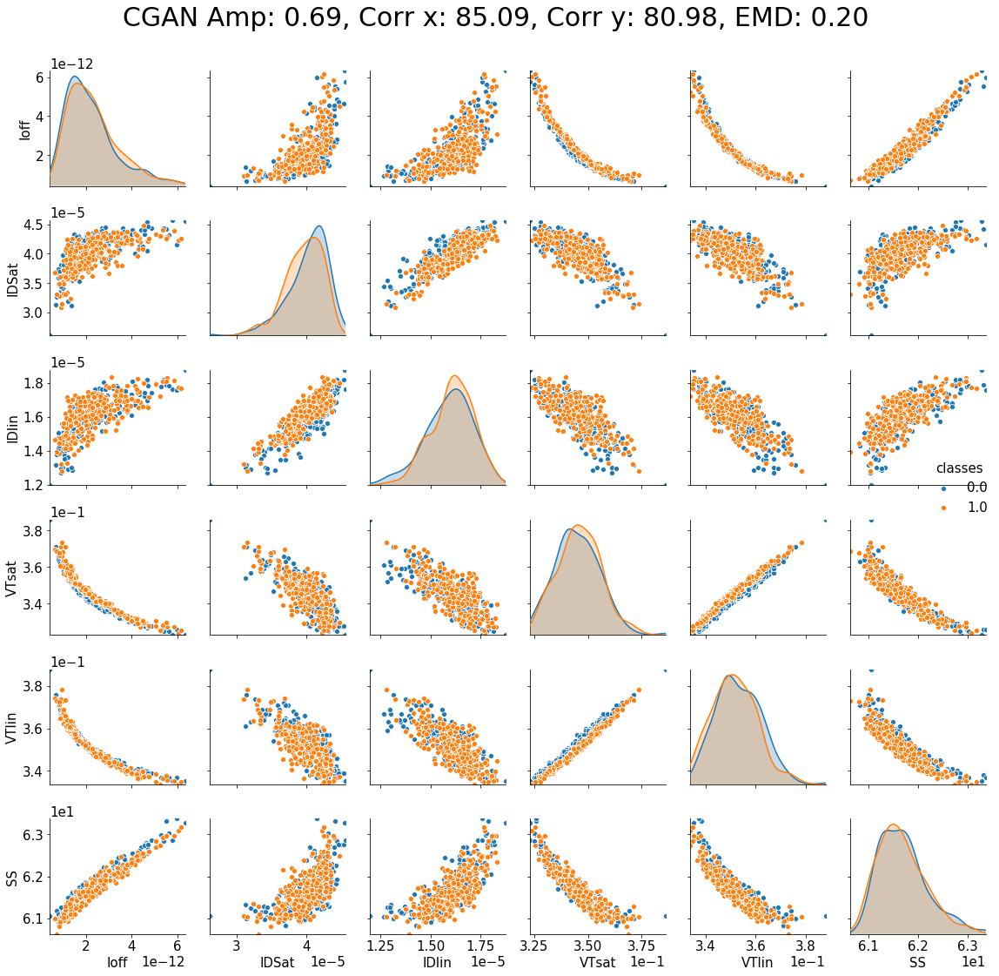

factor 8
2000 2250
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [1.46300000e-12 3.91500000e-05 1.52367277e-05 3.33000000e-01
 3.40377863e-01 6.12830000e+01 0.00000000e+00]
maximum y value for each varaible: [3.62610500e-12 4.45600000e-05 1.74900000e-05 3.51684294e-01
 3.57000000e-01 6.22240848e+01 1.00000000e+00]
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


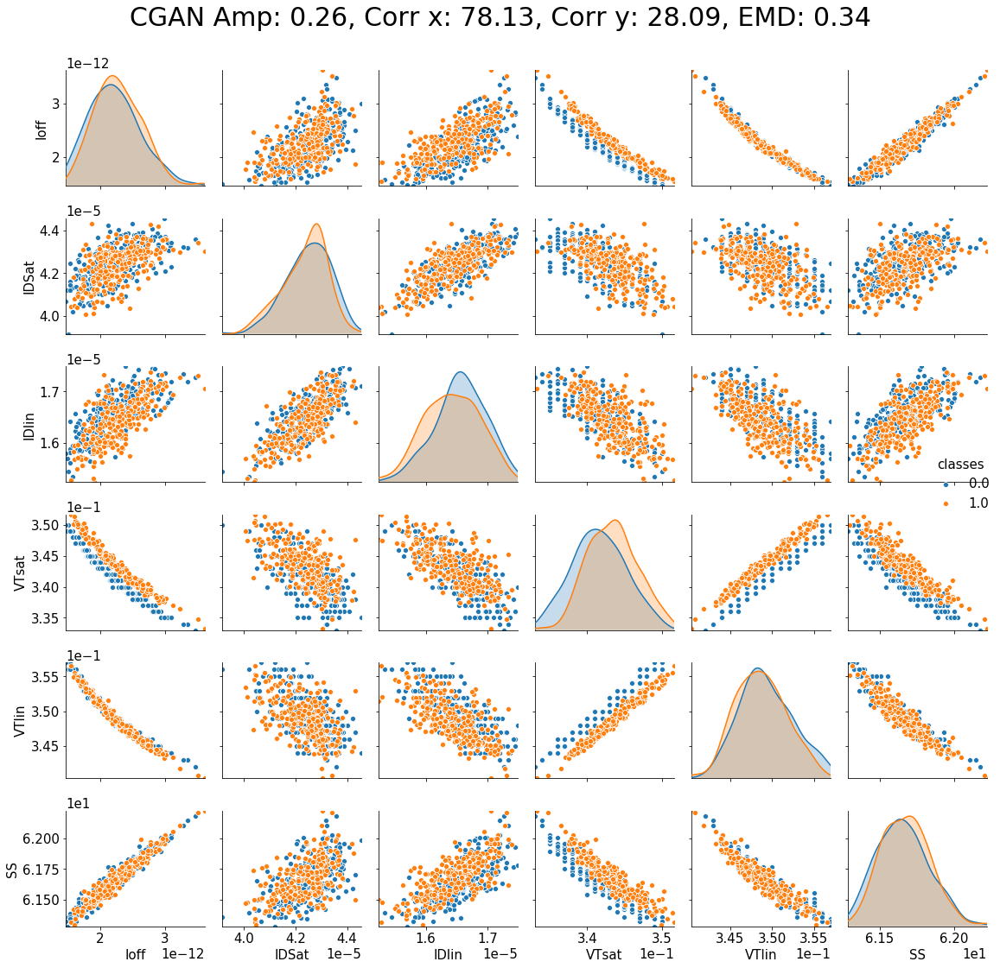

factor 9
2250 2500
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
minimum y value for each varaible: [1.52900000e-12 4.10700000e-05 1.57022964e-05 3.34000000e-01
 3.44000000e-01 6.13110000e+01 0.00000000e+00]
maximum y value for each varaible: [3.11073025e-12 4.44300000e-05 1.73300000e-05 3.49000000e-01
 3.56000000e-01 6.20023261e+01 1.00000000e+00]
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


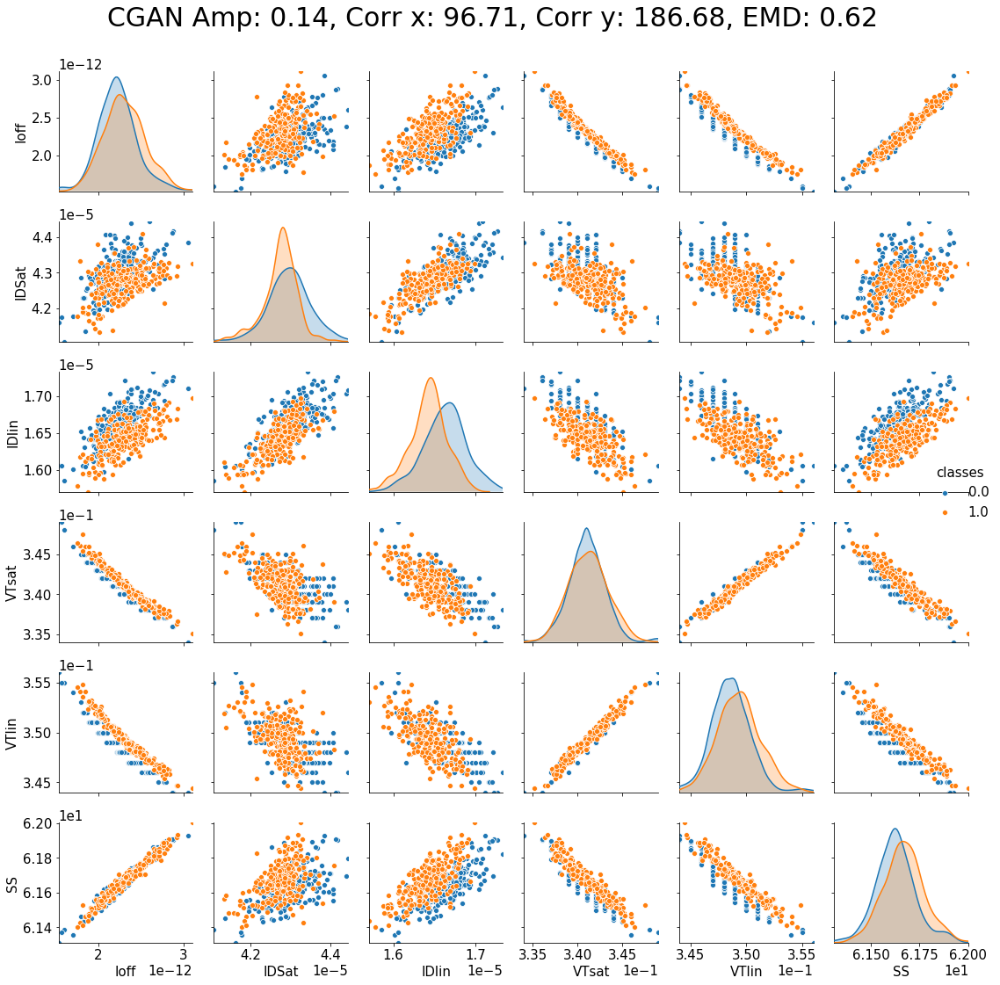

In [7]:
# gen_factor = 7
# test_sample_num = int(total_result_test.shape[0]/15)
# test_gan_matrix_plot = total_result_test[gen_factor * test_sample_num:(gen_factor+1)*test_sample_num]

for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle[:factor]),sum(num_in_cycle[:factor])+num_in_cycle[factor])
    test_gan_matrix_plot = test_gen[factor * test_gen_sample_num:(factor+1)*test_gen_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = test_real[sum(num_in_cycle[:factor]):sum(num_in_cycle[:factor])+num_in_cycle[factor]]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((test_gen_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle[factor], 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)

#    print(df1_test)
    
        # min, max for generated Y value ( used for scatter plot limit standard )

    test_min_list = total_test_matrix_plot.min(axis=0)
    test_max_list = total_test_matrix_plot.max(axis=0)
    print("minimum y value for each varaible:", test_min_list)
    print("maximum y value for each varaible:", test_max_list)

    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.2f}, Corr x: {:.2f}, Corr y: {:.2f}, EMD: {:.2f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((test_min_list[i],test_max_list[i]))
        g.axes[i,i].set_ylim((test_min_list[i],test_max_list[i]))

    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')

    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/Test_Custom_factor_{}_sample_{}.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()


    ### 파란색이 real 주황색이 generated

# 2. Same scale

factor 0
0 250
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [  0.62484672  17.00743225 173.85718891   1.           0.        ]


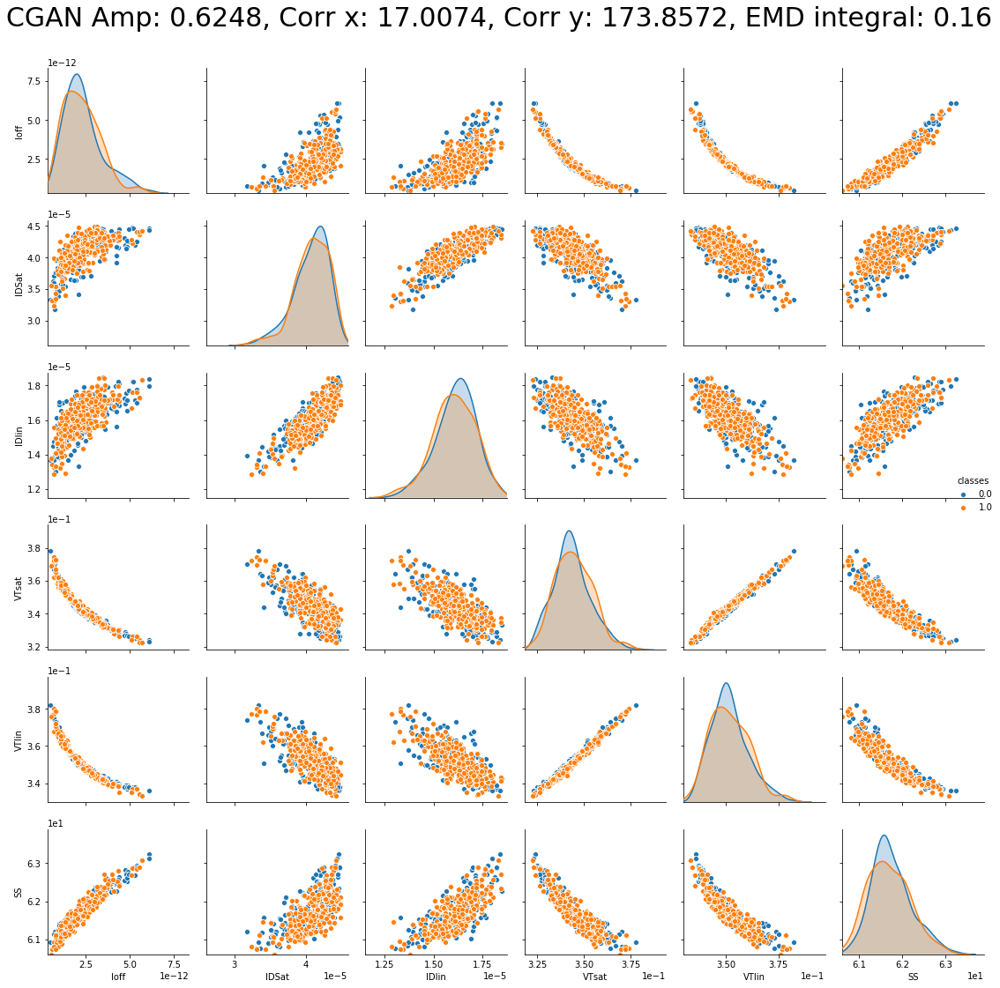

factor 1
250 500
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [ 0.55654727 80.91905766 80.56986979  1.          0.        ]


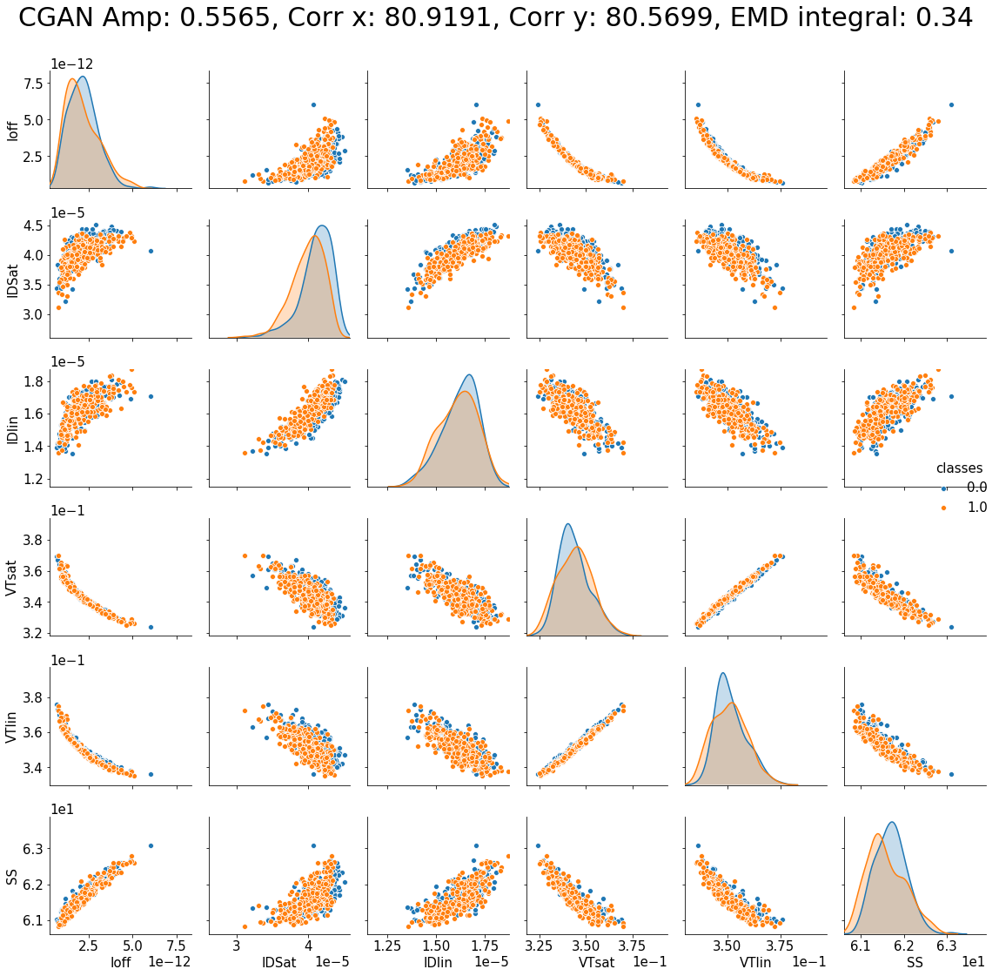

factor 2
500 750
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [ 0.50466944 48.62398816 67.99380535  1.          0.        ]


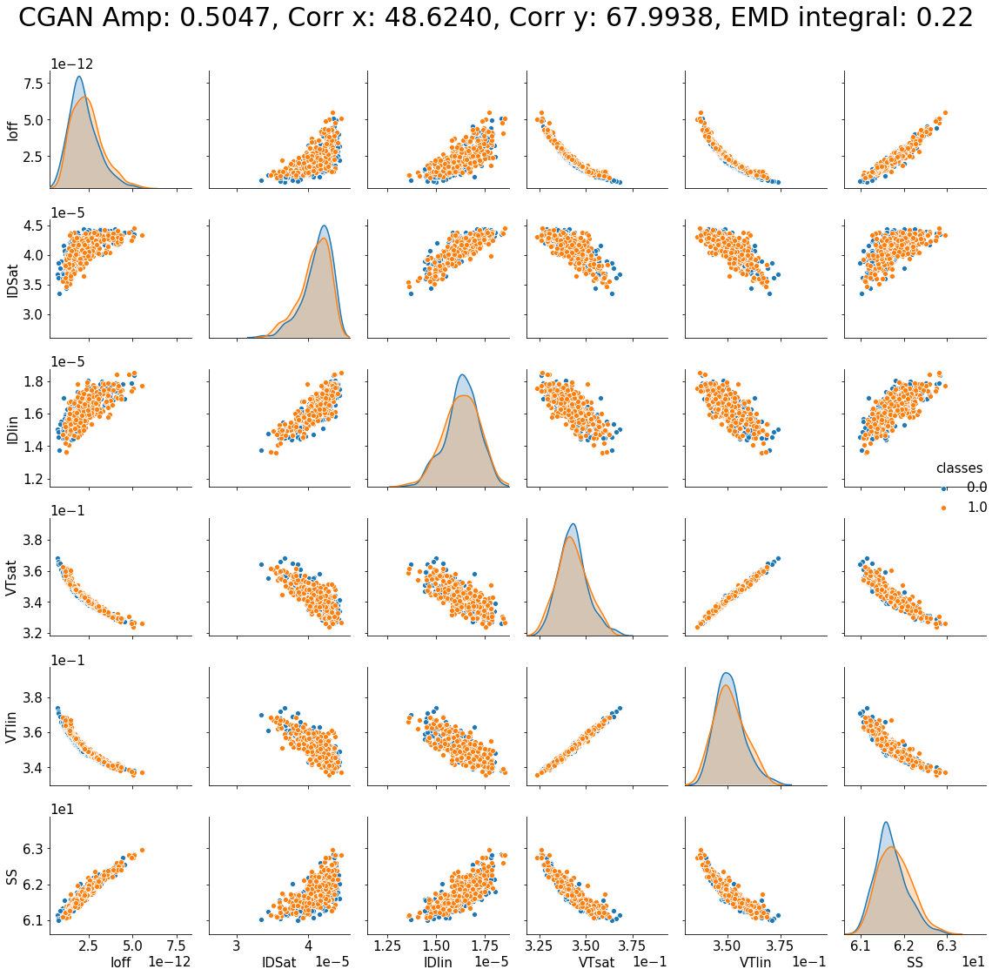

factor 3
750 1000
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [ 0.56045148 25.42868151 69.39740975  1.          0.        ]


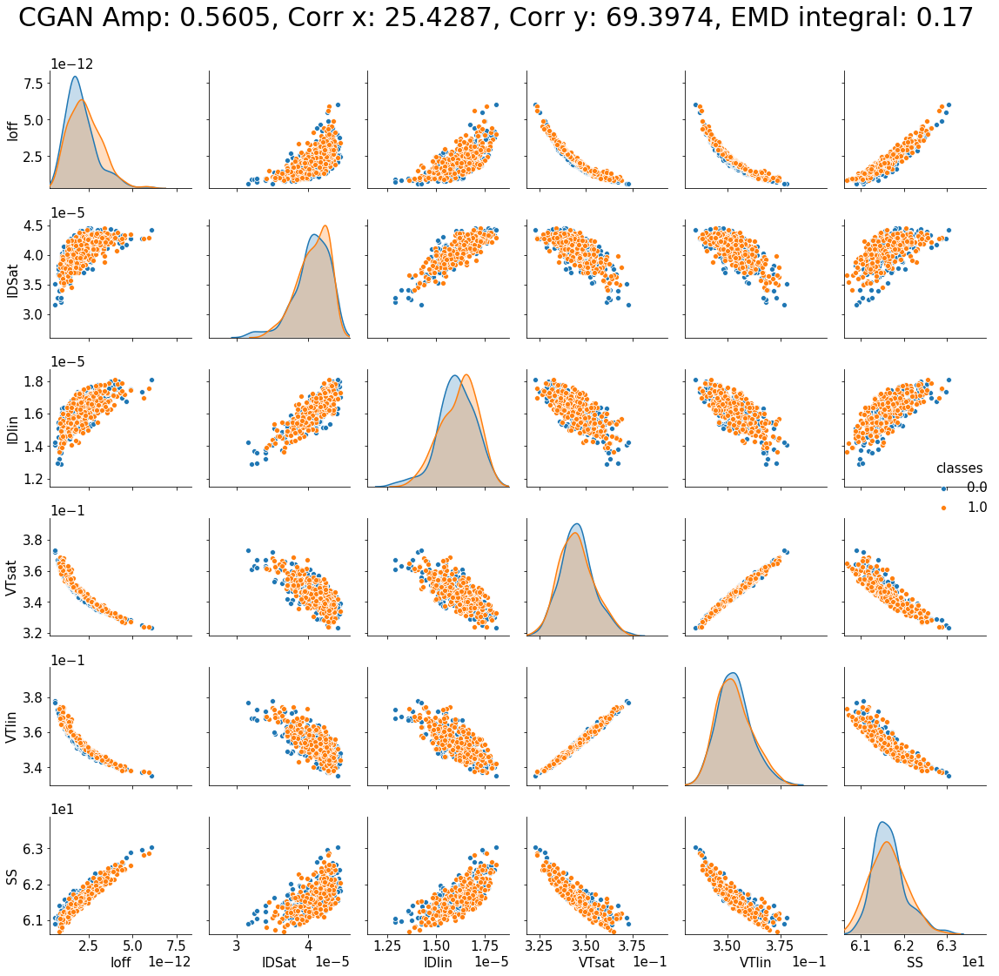

factor 4
1000 1250
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [ 0.63730798 69.14860261 65.33037708  1.          0.        ]


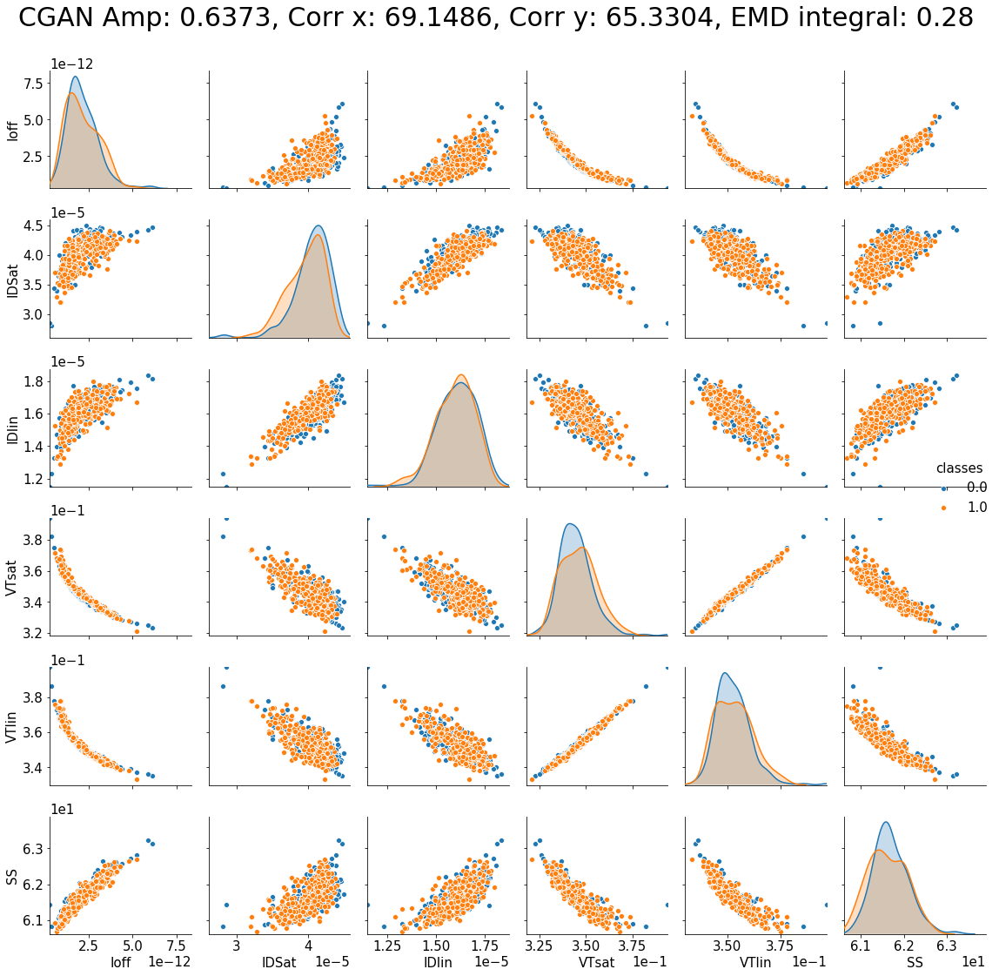

factor 5
1250 1500
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [  0.72951307  89.39156879 205.62484728   1.           0.        ]


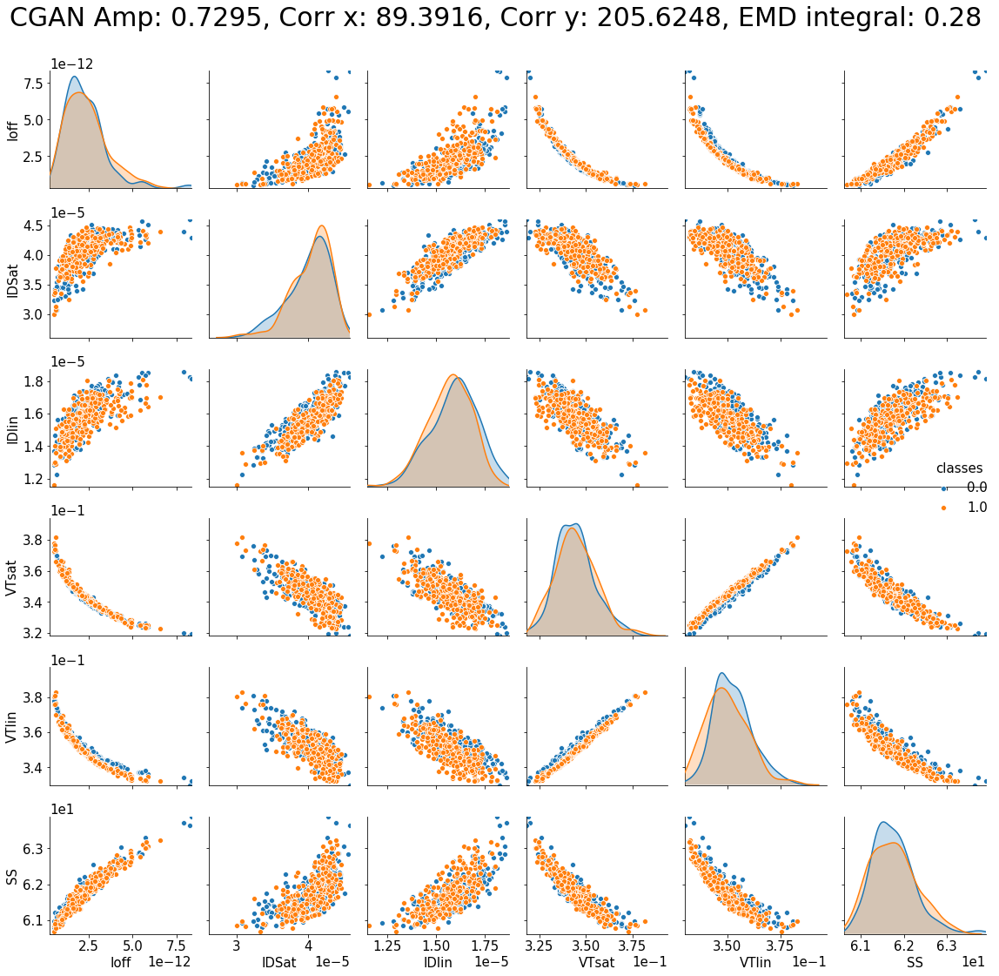

factor 6
1500 1750
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [ 0.15273618 23.32639122 51.25326965  1.          0.        ]


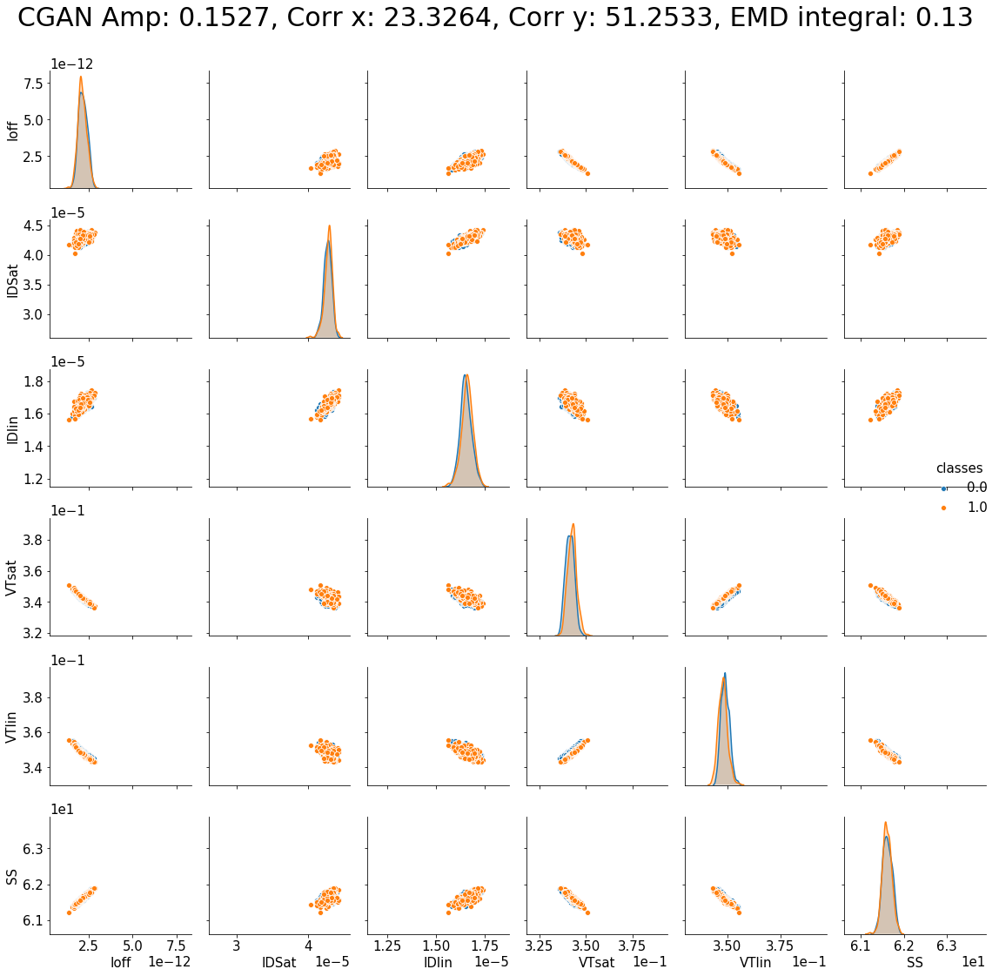

factor 7
1750 2000
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [ 0.68988283 85.08858437 80.98368203  1.          0.        ]


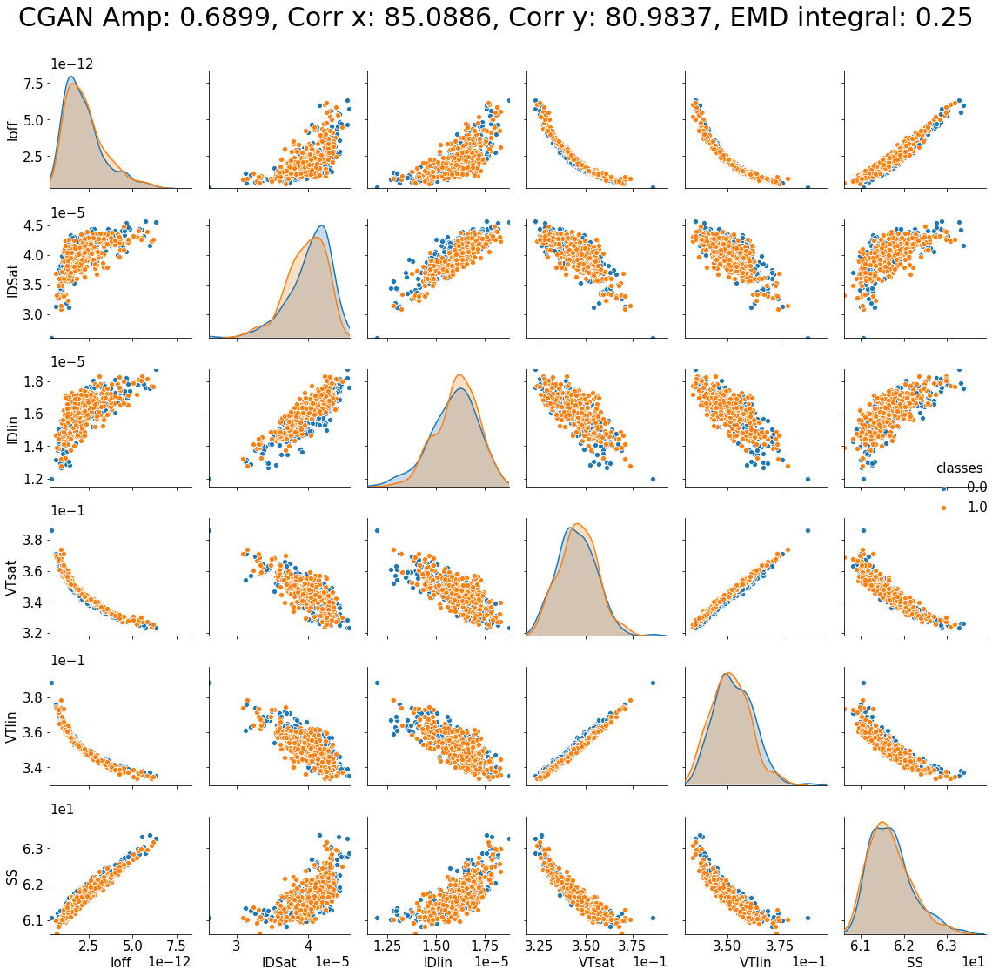

factor 8
2000 2250
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [ 0.25925637 78.12653757 28.08679576  1.          0.        ]


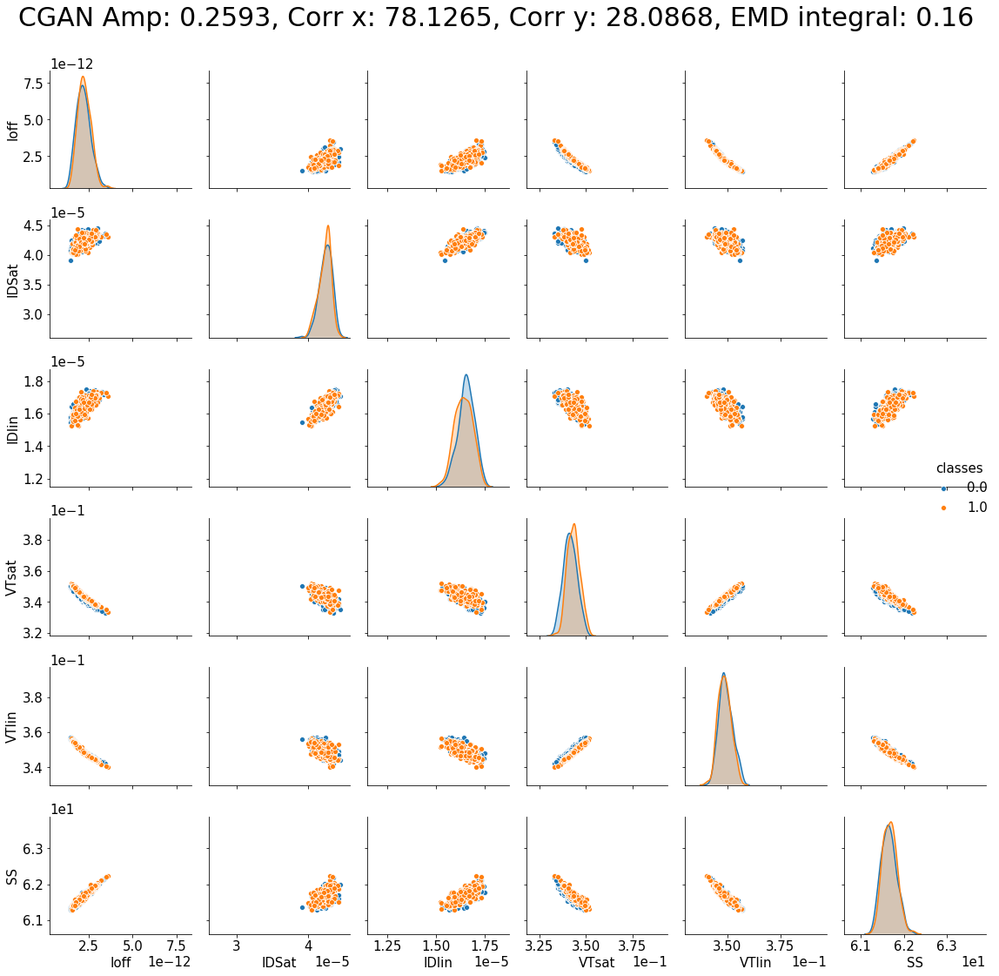

factor 9
2250 2500
Generated sample shape: (250, 6)
real sample shape: (250, 6)

Assigning class for visualization (generated: 0, real:1 )
generated sample class shape: (250, 1)
real sample class shape: (250, 1)
X input [1.41144023e-01 9.67099798e+01 1.86683747e+02 1.00000000e+00
 0.00000000e+00]


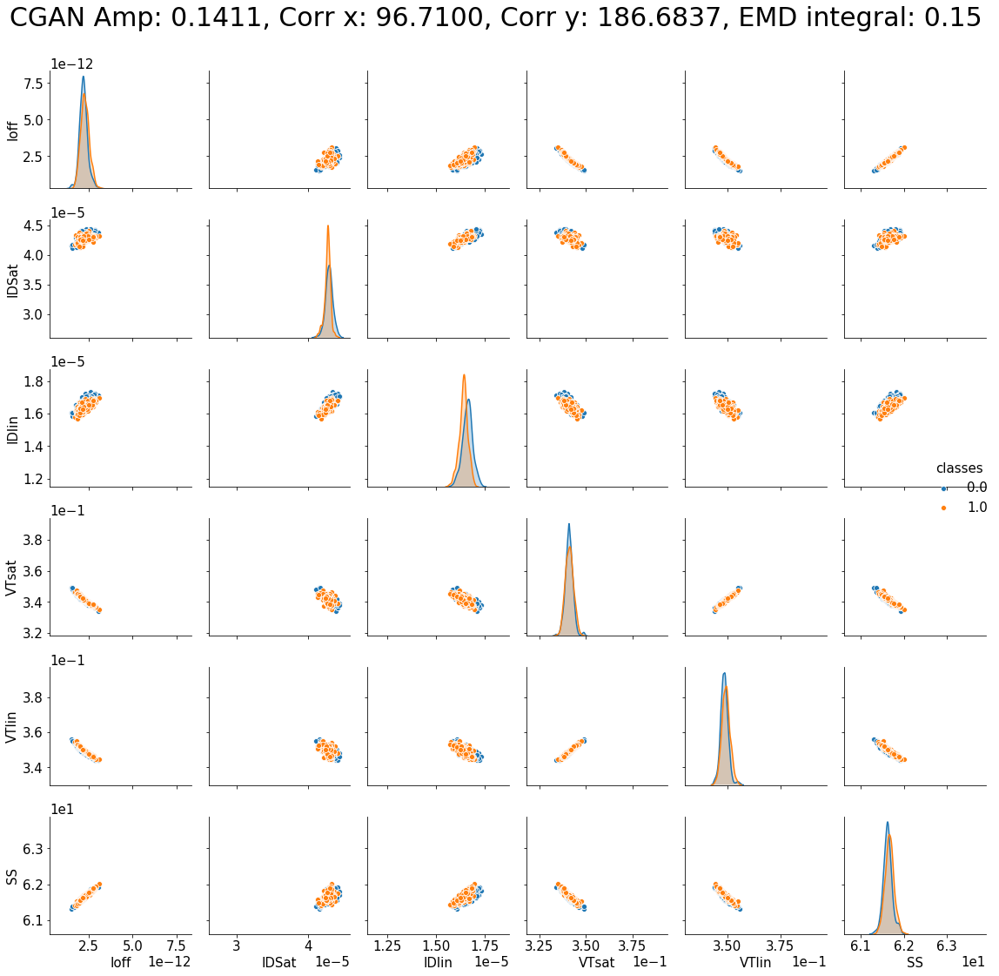

In [6]:
for factor in range(num_of_cycle):
    
    print("factor", factor)

    ##############################################################################################################
    """
    for i in range(6):
        print(np.min(total_result[:,i]))
        print(np.max(total_result[:,i]))
        print(np.min(real[:,i]))
        print(np.max(real[:,i]))
    """

    # generated sample
    print(sum(num_in_cycle[:factor]),sum(num_in_cycle[:factor])+num_in_cycle[factor])
    test_gan_matrix_plot = test_gen[factor * test_gen_sample_num:(factor+1)*test_gen_sample_num]
    print("Generated sample shape:", test_gan_matrix_plot.shape)

    # real sample
    test_real_matrix_plot = test_real[sum(num_in_cycle[:factor]):sum(num_in_cycle[:factor])+num_in_cycle[factor]]
    print("real sample shape:", test_real_matrix_plot.shape)
    print()

    # Assigning class(generated: 0, real:1 ) for visualization

    print("Assigning class for visualization (generated: 0, real:1 )")

    test_gan_cls = np.ones((test_gen_sample_num, 1))
    print("generated sample class shape:", test_gan_cls.shape)
    test_real_cls = np.zeros((num_in_cycle[factor], 1))
    print("real sample class shape:", test_real_cls.shape)

    test_temp1 = np.hstack([test_gan_matrix_plot, test_gan_cls])
    test_temp2 = np.hstack([test_real_matrix_plot, test_real_cls])

    # TOTAL PANDAS DATA
    total_test_matrix_plot = np.vstack([test_temp1, test_temp2])
    # print(total_matrix_plot.shape)

    # A: Ioff, B: IDSat, C: IDlin, D: VTsat, E:VTlin, F:SS, G: classes
    df1_test = pd.DataFrame(total_test_matrix_plot, columns=['Ioff', 'IDSat',  'IDlin',  'VTsat', 'VTlin', 'SS', 'classes'])
    # print(df1)
    
#     print(np.min(test_min_list))
#     print(np.max(test_max_list, axis=1))
    X_test = X_per_cycle[factor]

    print("X input", X_test)

    g = sns.pairplot(df1_test, hue = 'classes')
    for i in range(6):
        g.fig.suptitle("CGAN Amp: {:.4f}, Corr x: {:.4f}, Corr y: {:.4f}, EMD integral: {:.2f}".format(X_test[0], X_test[1], X_test[2], EMD_score_list_integral[factor]), y=1.04, fontsize=30)
        g.axes[i,i].set_xlim((min_per_out_v[i], max_per_out_v[i]))
        g.axes[i,i].set_ylim((min_per_out_v[i], max_per_out_v[i]))
    
    for ax in g.axes.flatten():
        ax.ticklabel_format(style='sci', scilimits=(0,0), axis='both')
    
    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.savefig('figures/Test_same_factor_{}_sample_{}.pdf'.format(factor, test_gen_sample_num), bbox_inches='tight', transparent=True, pad_inches=0)
    plt.show()
    
    ### 파란색이 real 주황색이 generated